In [27]:
import numpy as np
import pandas as pd
%matplotlib inline 
import seaborn as sns
import matplotlib.pyplot as plt
housing = pd.read_csv(r"C:\Users\rupal\Ames_Housing_Price_Data.csv",index_col=0)
housing.shape

(2580, 81)

In [28]:
#Created missing_value_columns to see all the columns that are missing values
missing_value_columns=housing.isnull().sum(axis=0).sort_values(ascending=False)
missing_value_columns=missing_value_columns.rename_axis('Attributes').to_frame('Counts')
missing_value_columns = missing_value_columns.loc[missing_value_columns.Counts!=0]

In [29]:
missing_value_columns

,Counts
Attributes,
PoolQC,2571
MiscFeature,2483
Alley,2412
Fence,2055
FireplaceQu,1241
LotFrontage,462
GarageQual,129
GarageYrBlt,129
GarageFinish,129


In [30]:
housing['PoolQC'].value_counts()

TA    3
Gd    2
Ex    2
Fa    2
Name: PoolQC, dtype: int64

In [31]:
housing['MiscFeature'].value_counts()

Shed    88
Gar2     5
Othr     3
TenC     1
Name: MiscFeature, dtype: int64

In [32]:
housing['Fence'].value_counts()

MnPrv    301
GdPrv    111
GdWo     103
MnWw      10
Name: Fence, dtype: int64

In [33]:
housing['Alley'].value_counts()

Grvl    105
Pave     63
Name: Alley, dtype: int64

In [34]:
# Created a copy of the dataframe
housing_fill = housing.copy()

In [35]:
housing.head()

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1,909176150,856,126000,30,RL,NaN,7890,Pave,NaN,Reg,...,166,0,NaN,NaN,NaN,0,3,2010,WD,Normal
2,905476230,1049,139500,120,RL,42.0,4235,Pave,NaN,Reg,...,0,0,NaN,NaN,NaN,0,2,2009,WD,Normal
3,911128020,1001,124900,30,C (all),60.0,6060,Pave,NaN,Reg,...,0,0,NaN,NaN,NaN,0,11,2007,WD,Normal
4,535377150,1039,114000,70,RL,80.0,8146,Pave,NaN,Reg,...,111,0,NaN,NaN,NaN,0,5,2009,WD,Normal
5,534177230,1665,227000,60,RL,70.0,8400,Pave,NaN,Reg,...,0,0,NaN,NaN,NaN,0,11,2009,WD,Normal


In [36]:
# Filled 'Naa' meaning 'no alley access' in rows that had null values based on data_description
housing_fill.loc[housing_fill.Alley.isnull(),'Alley'] = 'Naa'

In [37]:
housing_fill['Alley'].value_counts()

Naa     2412
Grvl     105
Pave      63
Name: Alley, dtype: int64

In [38]:
# Filled 'Nf' meaning 'no fence' in rows that had null values based on data_description
housing_fill.loc[housing_fill.Fence.isnull(),'Fence'] = 'Nf'

In [39]:
housing_fill.head()

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1,909176150,856,126000,30,RL,NaN,7890,Pave,Naa,Reg,...,166,0,NaN,Nf,NaN,0,3,2010,WD,Normal
2,905476230,1049,139500,120,RL,42.0,4235,Pave,Naa,Reg,...,0,0,NaN,Nf,NaN,0,2,2009,WD,Normal
3,911128020,1001,124900,30,C (all),60.0,6060,Pave,Naa,Reg,...,0,0,NaN,Nf,NaN,0,11,2007,WD,Normal
4,535377150,1039,114000,70,RL,80.0,8146,Pave,Naa,Reg,...,111,0,NaN,Nf,NaN,0,5,2009,WD,Normal
5,534177230,1665,227000,60,RL,70.0,8400,Pave,Naa,Reg,...,0,0,NaN,Nf,NaN,0,11,2009,WD,Normal


In [40]:
# Filled 'Nfp' meaning 'no fireplace' in FireplaceQu rows that had null values based on data_description
housing_fill.loc[housing_fill.FireplaceQu.isnull(),'FireplaceQu'] = 'Nfp'

In [41]:
#Filled 'Ng' meaning 'no garage' in rows that had null values based on data_description
housing_fill.loc[housing_fill.GarageQual.isnull(),'GarageQual'] = 'Ng'
housing_fill.loc[housing_fill.GarageFinish.isnull(),'GarageFinish'] = 'Ng'
housing_fill.loc[housing_fill.GarageCond.isnull(),'GarageCond'] = 'Ng'
housing_fill.loc[housing_fill.GarageType.isnull(),'GarageType'] = 'Ng'
housing_fill.loc[housing_fill.GarageType.isnull(),'GarageType'] = 'Ng'

In [42]:
#Filled 'Nb' meaning 'no basement' in rows that had null values based on data_description
housing_fill.loc[housing_fill.BsmtExposure.isnull(),'BsmtExposure'] = 'Nb'
housing_fill.loc[housing_fill.BsmtFinType2.isnull(),'BsmtFinType2'] = 'Nb'
housing_fill.loc[housing_fill.BsmtQual.isnull(),'BsmtQual'] = 'Nb'
housing_fill.loc[housing_fill.BsmtCond.isnull(),'BsmtCond'] = 'Nb'
housing_fill.loc[housing_fill.BsmtFinType1.isnull(),'BsmtFinType1'] = 'Nb'

In [43]:
# Majority rows i.e. 1554 have 0 in MasVnrArea so can't impute the area
housing_fill['MasVnrArea'].value_counts()

0.0      1554
120.0      13
216.0      11
108.0      10
176.0      10
         ... 
647.0       1
549.0       1
262.0       1
668.0       1
402.0       1
Name: MasVnrArea, Length: 416, dtype: int64

In [44]:
#Filled 'NA' meaning 'not available' in rows that had null values. This is only 14 rows for both columns
housing_fill.loc[housing_fill.MasVnrType.isnull(),'MasVnrType'] = 'NA'
housing_fill.loc[housing_fill.MasVnrArea.isnull(),'MasVnrArea'] = -1

In [45]:
#Filled -1 in rows that had null values. This is only 2 rows for BsmtFullBath and BsmtHalfBath each and 1 esch for the remaining Bsmt columns
housing_fill.loc[housing_fill.BsmtFullBath.isnull(),'BsmtFullBath'] = -1
housing_fill.loc[housing_fill.BsmtHalfBath.isnull(),'BsmtHalfBath'] = -1
housing_fill.loc[housing_fill.BsmtUnfSF.isnull(),'BsmtUnfSF'] = -1
housing_fill.loc[housing_fill.BsmtFinSF2.isnull(),'BsmtFinSF2'] = -1
housing_fill.loc[housing_fill.BsmtFinSF1.isnull(),'BsmtFinSF1'] = -1
housing_fill.loc[housing_fill.TotalBsmtSF.isnull(),'TotalBsmtSF'] = -1

In [46]:
housing_fill.loc[housing_fill.GarageCars.isnull(),'GarageCars'] = -1
housing_fill.loc[housing_fill.GarageArea.isnull(),'GarageArea'] = -1

In [47]:
# 129 missing (Nan) values in GarageYrBlt substituted with 1600
housing_fill.loc[housing_fill['GarageYrBlt']==1600,'GarageYrBlt'] = 1900

In [48]:
housing_fill.GarageYrBlt.unique()

array([1939., 1984., 1930., 1940., 2001., 2003., 1974., 2007., 2005.,
       1993., 1920., 1963., 2002.,   nan, 1977., 2006., 1948., 1950.,
       1997., 2000., 1973., 1938., 1922., 1964., 2008., 1999., 1921.,
       1976., 1983., 1958., 1990., 2004., 1949., 1966., 1972., 1960.,
       1991., 1954., 1978., 1969., 1916., 1971., 1975., 1959., 1970.,
       1956., 1979., 1965., 1961., 1962., 1981., 1992., 1998., 1917.,
       1980., 1955., 1996., 1910., 1957., 1994., 1943., 1968., 1951.,
       2009., 1900., 1995., 1925., 1988., 1952., 1953., 1987., 1926.,
       1989., 1945., 1941., 1937., 1982., 1927., 1986., 1915., 1967.,
       1985., 1908., 1947., 1936., 1924., 1928., 1934., 2010., 1946.,
       1929., 1935., 1932., 1942., 1931., 1914., 1933., 1923., 1918.,
       1906., 1895.])

In [49]:
housing['LotFrontage'].value_counts()

60.0     246
80.0     128
70.0     124
50.0     111
75.0      92
        ... 
137.0      1
135.0      1
119.0      1
195.0      1
141.0      1
Name: LotFrontage, Length: 126, dtype: int64

In [50]:
housing_fill.to_csv('./housing_fill.csv')

(0.0, 20000.0)

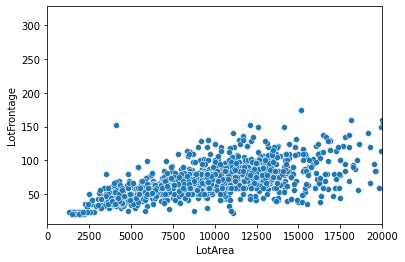

In [51]:
sns.scatterplot(x='LotArea', y='LotFrontage', data = housing_fill)
plt.xlim(0, 20000)

In [52]:
housing_fill.head()

,PID,GrLivArea,SalePrice,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,...,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1,909176150,856,126000,30,RL,NaN,7890,Pave,Naa,Reg,...,166,0,NaN,Nf,NaN,0,3,2010,WD,Normal
2,905476230,1049,139500,120,RL,42.0,4235,Pave,Naa,Reg,...,0,0,NaN,Nf,NaN,0,2,2009,WD,Normal
3,911128020,1001,124900,30,C (all),60.0,6060,Pave,Naa,Reg,...,0,0,NaN,Nf,NaN,0,11,2007,WD,Normal
4,535377150,1039,114000,70,RL,80.0,8146,Pave,Naa,Reg,...,111,0,NaN,Nf,NaN,0,5,2009,WD,Normal
5,534177230,1665,227000,60,RL,70.0,8400,Pave,Naa,Reg,...,0,0,NaN,Nf,NaN,0,11,2009,WD,Normal


In [53]:
housing_fill_drop = housing_fill.drop(['PoolQC', 'MiscFeature'], axis =1)

In [54]:
housing_fill_drop.sort_index(axis=1).head()

,1stFlrSF,2ndFlrSF,3SsnPorch,Alley,BedroomAbvGr,BldgType,BsmtCond,BsmtExposure,BsmtFinSF1,BsmtFinSF2,...,SaleType,ScreenPorch,Street,TotRmsAbvGrd,TotalBsmtSF,Utilities,WoodDeckSF,YearBuilt,YearRemodAdd,YrSold
1,856,0,0,Naa,2,1Fam,TA,No,238.0,0.0,...,WD,166,Pave,4,856.0,AllPub,0,1939,1950,2010
2,1049,0,0,Naa,2,TwnhsE,TA,Mn,552.0,393.0,...,WD,0,Pave,5,1049.0,AllPub,0,1984,1984,2009
3,1001,0,86,Naa,2,1Fam,TA,No,737.0,0.0,...,WD,0,Pave,5,837.0,AllPub,154,1930,2007,2007
4,717,322,0,Naa,2,1Fam,TA,No,0.0,0.0,...,WD,111,Pave,6,405.0,AllPub,0,1900,2003,2009
5,810,855,0,Naa,3,1Fam,TA,No,643.0,0.0,...,WD,0,Pave,6,810.0,AllPub,0,2001,2001,2009


In [55]:
housing_fill_drop.sort_index(axis=1).columns

Index(['1stFlrSF', '2ndFlrSF', '3SsnPorch', 'Alley', 'BedroomAbvGr',
       'BldgType', 'BsmtCond', 'BsmtExposure', 'BsmtFinSF1', 'BsmtFinSF2',
       'BsmtFinType1', 'BsmtFinType2', 'BsmtFullBath', 'BsmtHalfBath',
       'BsmtQual', 'BsmtUnfSF', 'CentralAir', 'Condition1', 'Condition2',
       'Electrical', 'EnclosedPorch', 'ExterCond', 'ExterQual', 'Exterior1st',
       'Exterior2nd', 'Fence', 'FireplaceQu', 'Fireplaces', 'Foundation',
       'FullBath', 'Functional', 'GarageArea', 'GarageCars', 'GarageCond',
       'GarageFinish', 'GarageQual', 'GarageType', 'GarageYrBlt', 'GrLivArea',
       'HalfBath', 'Heating', 'HeatingQC', 'HouseStyle', 'KitchenAbvGr',
       'KitchenQual', 'LandContour', 'LandSlope', 'LotArea', 'LotConfig',
       'LotFrontage', 'LotShape', 'LowQualFinSF', 'MSSubClass', 'MSZoning',
       'MasVnrArea', 'MasVnrType', 'MiscVal', 'MoSold', 'Neighborhood',
       'OpenPorchSF', 'OverallCond', 'OverallQual', 'PID', 'PavedDrive',
       'PoolArea', 'RoofMatl', 'Roof

In [56]:
housing_fill_drop['MasVnrArea'].value_counts().sort_values()

 668.0       1
 572.0       1
 426.0       1
 760.0       1
 253.0       1
          ... 
 176.0      10
 216.0      11
 120.0      13
-1.0        14
 0.0      1554
Name: MasVnrArea, Length: 417, dtype: int64

In [57]:
housing_fill_drop.loc[housing_fill_drop.YearBuilt >= 2000].YearBuilt.value_counts().sum()

607

In [58]:
housing_fill_drop['MasVnrArea'].shape

(2580,)

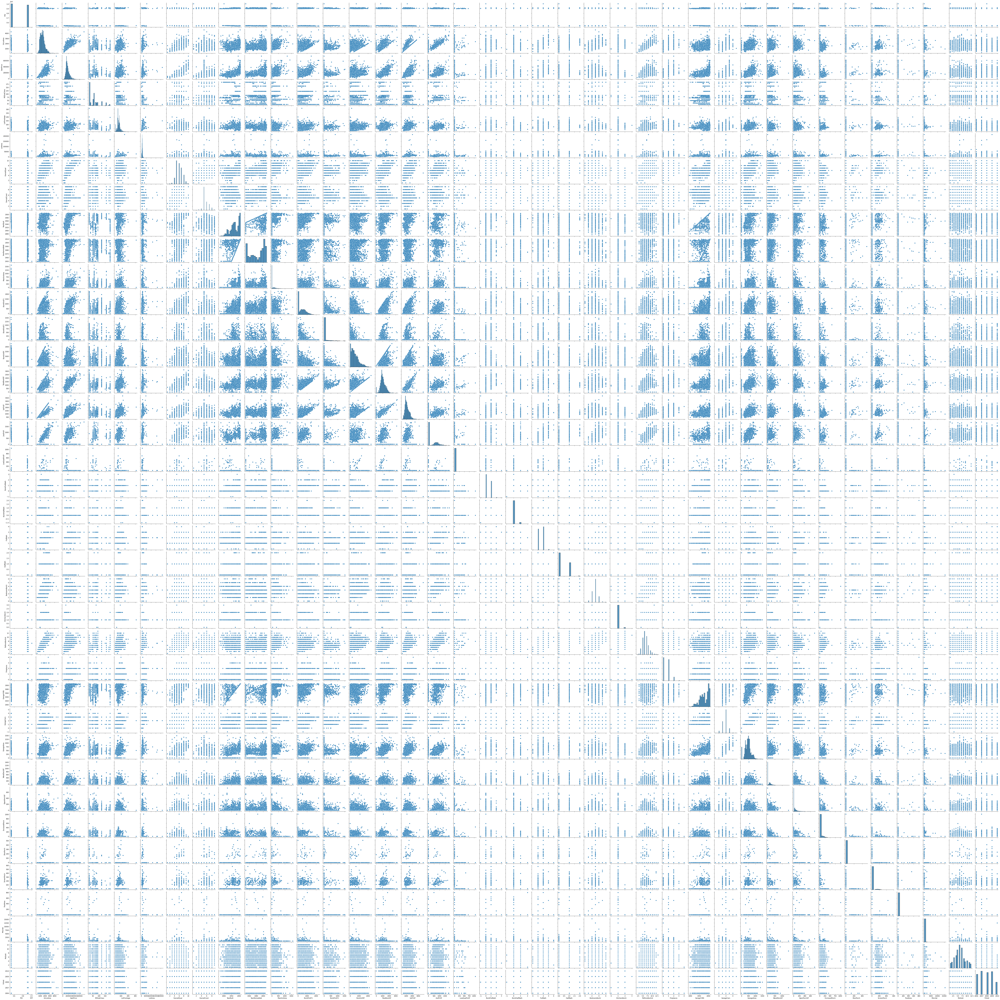

In [59]:
sns.pairplot(housing_fill_drop)

In [60]:
housing_fill_drop['BsmtFinSF1'].value_counts().sort_values(ascending=False)

0.0       774
24.0       22
16.0       12
288.0       8
602.0       8
         ... 
175.0       1
556.0       1
996.0       1
187.0       1
1728.0      1
Name: BsmtFinSF1, Length: 928, dtype: int64

In [61]:
housing_fill_drop['BsmtFinSF2'].shape

(2580,)

<AxesSubplot:xlabel='BldgType', ylabel='SalePrice'>

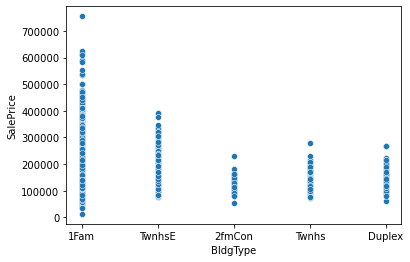

In [62]:
sns.scatterplot(x='BldgType', y='SalePrice', data= housing_fill_drop)

In [63]:
housing_fill_drop['BldgType'].value_counts().sum()

2580

<AxesSubplot:xlabel='BsmtCond', ylabel='SalePrice'>

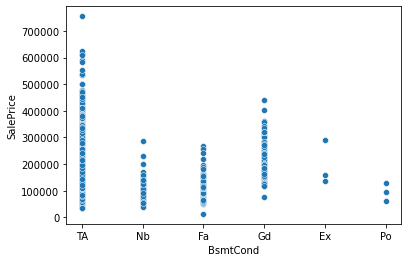

In [64]:
sns.scatterplot(x='BsmtCond', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='BsmtExposure', ylabel='SalePrice'>

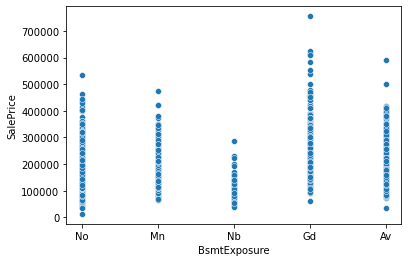

In [65]:
sns.scatterplot(x='BsmtExposure', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='BsmtFinType1', ylabel='SalePrice'>

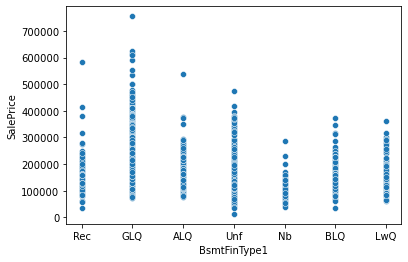

In [66]:
sns.scatterplot(x='BsmtFinType1', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='BsmtFinType2', ylabel='SalePrice'>

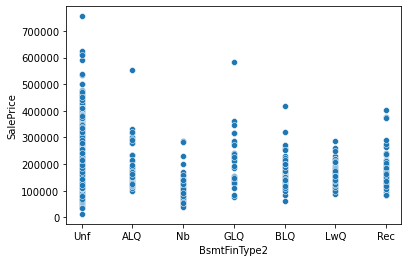

In [67]:
sns.scatterplot(x='BsmtFinType2', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='BsmtQual', ylabel='SalePrice'>

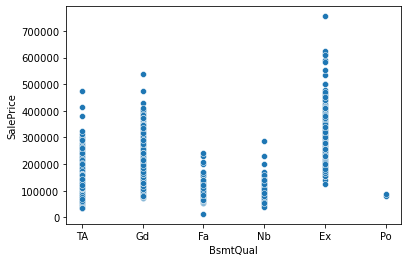

In [68]:
sns.scatterplot(x='BsmtQual', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='CentralAir', ylabel='SalePrice'>

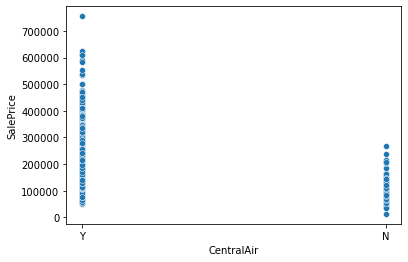

In [69]:
sns.scatterplot(x='CentralAir', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='Condition1', ylabel='SalePrice'>

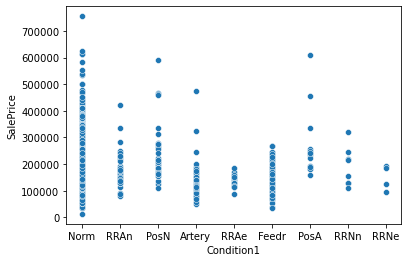

In [70]:
sns.scatterplot(x='Condition1', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='Condition2', ylabel='SalePrice'>

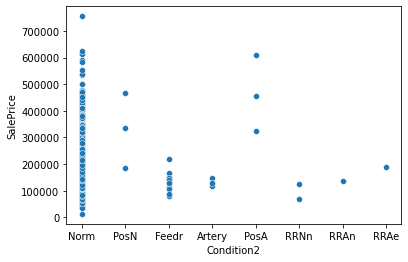

In [71]:
sns.scatterplot(x='Condition2', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='Electrical', ylabel='SalePrice'>

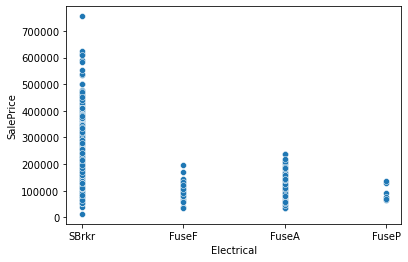

In [72]:
sns.scatterplot(x='Electrical', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='ExterCond', ylabel='SalePrice'>

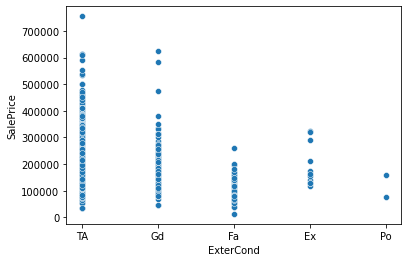

In [73]:
sns.scatterplot(x='ExterCond', y='SalePrice', data= housing_fill_drop)

<AxesSubplot:xlabel='ExterQual', ylabel='SalePrice'>

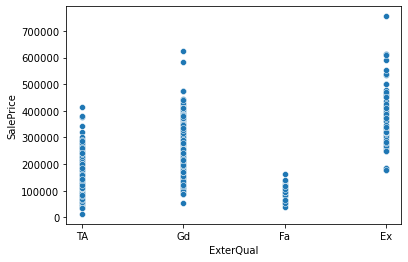

In [74]:
sns.scatterplot(x='ExterQual', y='SalePrice', data= housing_fill_drop)

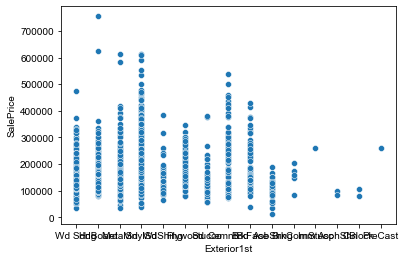

In [75]:
sns.scatterplot(x='Exterior1st', y='SalePrice', data= housing_fill_drop)
sns.set(rc={'figure.figsize':(15,20)})

<AxesSubplot:xlabel='FireplaceQu', ylabel='SalePrice'>

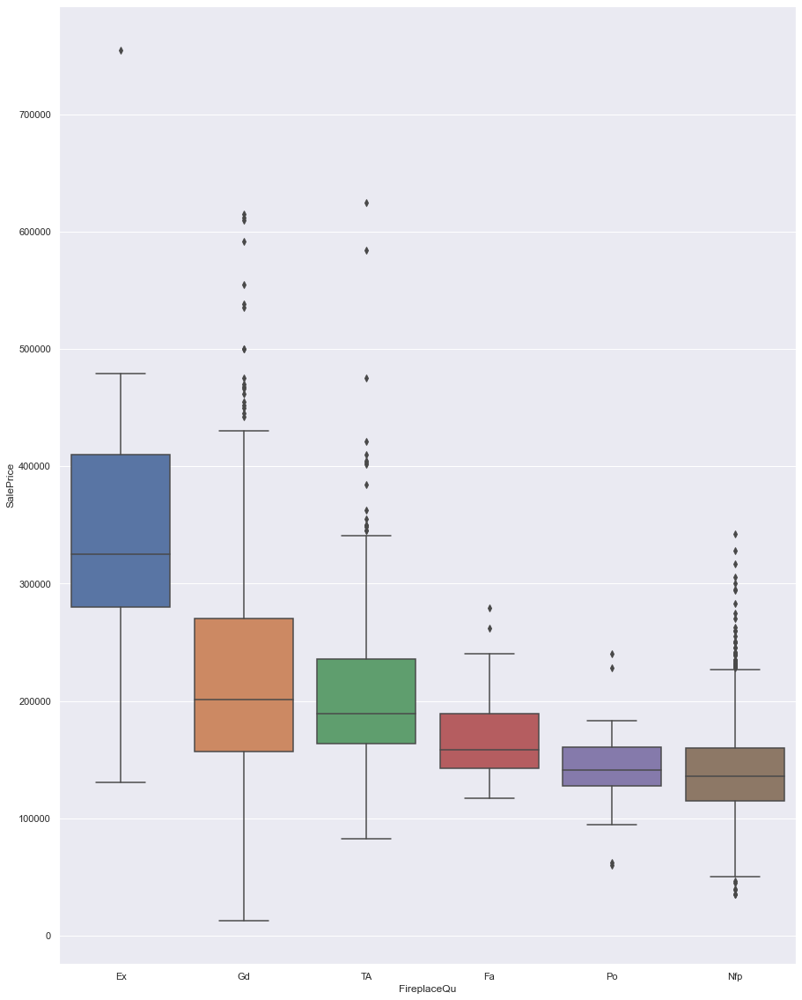

In [76]:
#FireplaceQu
ordered=housing_fill_drop.groupby(by=["FireplaceQu"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='FireplaceQu', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='Fireplaces', ylabel='SalePrice'>

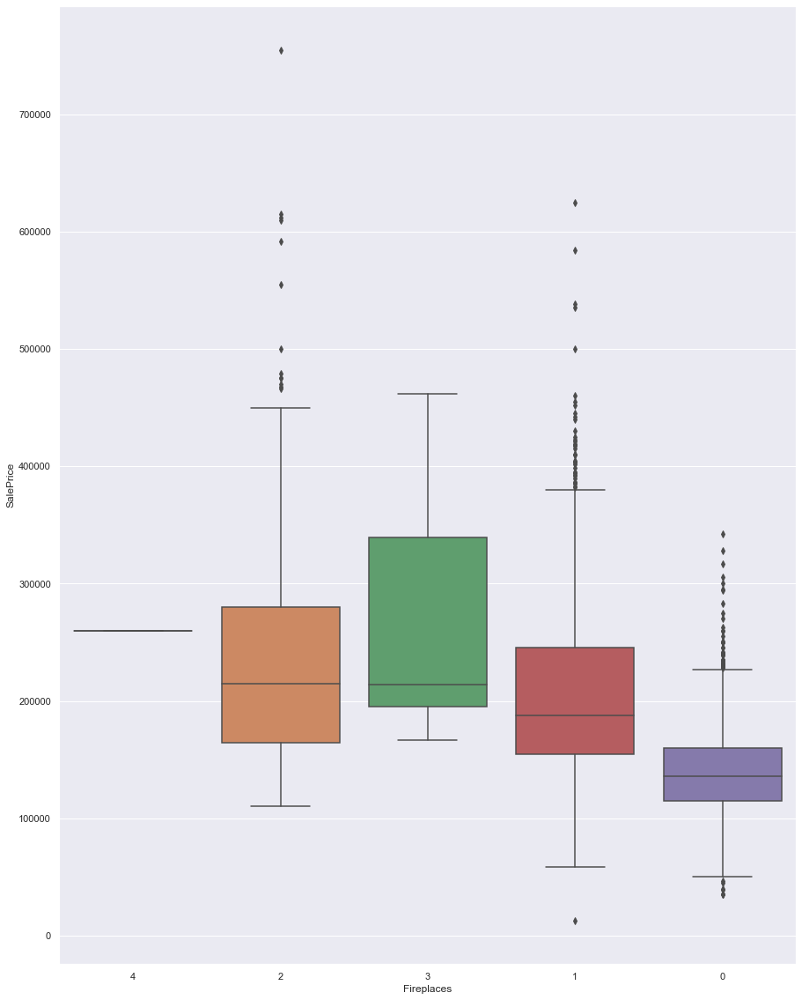

In [77]:
#Fireplaces
ordered=housing_fill_drop.groupby(by=["Fireplaces"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Fireplaces', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='Foundation', ylabel='SalePrice'>

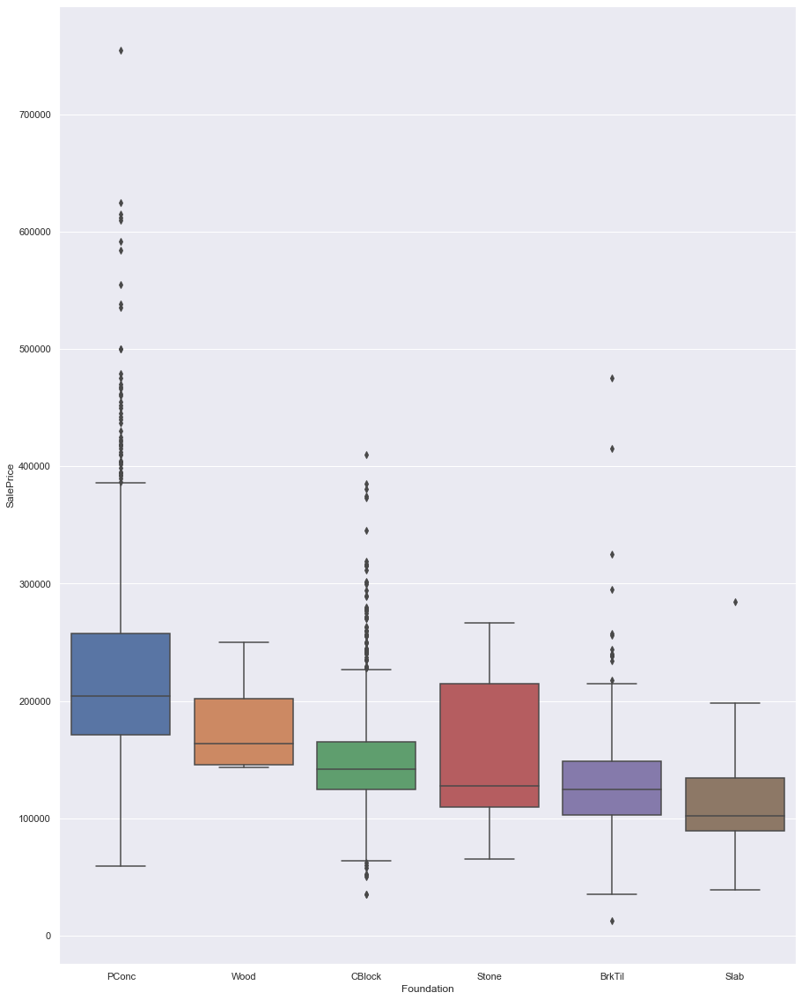

In [78]:
#Foundation
ordered=housing_fill_drop.groupby(by=["Foundation"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Foundation', y='SalePrice', data= housing_fill_drop, order=ordered)

In [79]:
housing_fill_drop['Foundation'].value_counts()

CBlock    1140
PConc     1105
BrkTil     278
Slab        42
Stone       10
Wood         5
Name: Foundation, dtype: int64

<AxesSubplot:xlabel='FullBath', ylabel='SalePrice'>

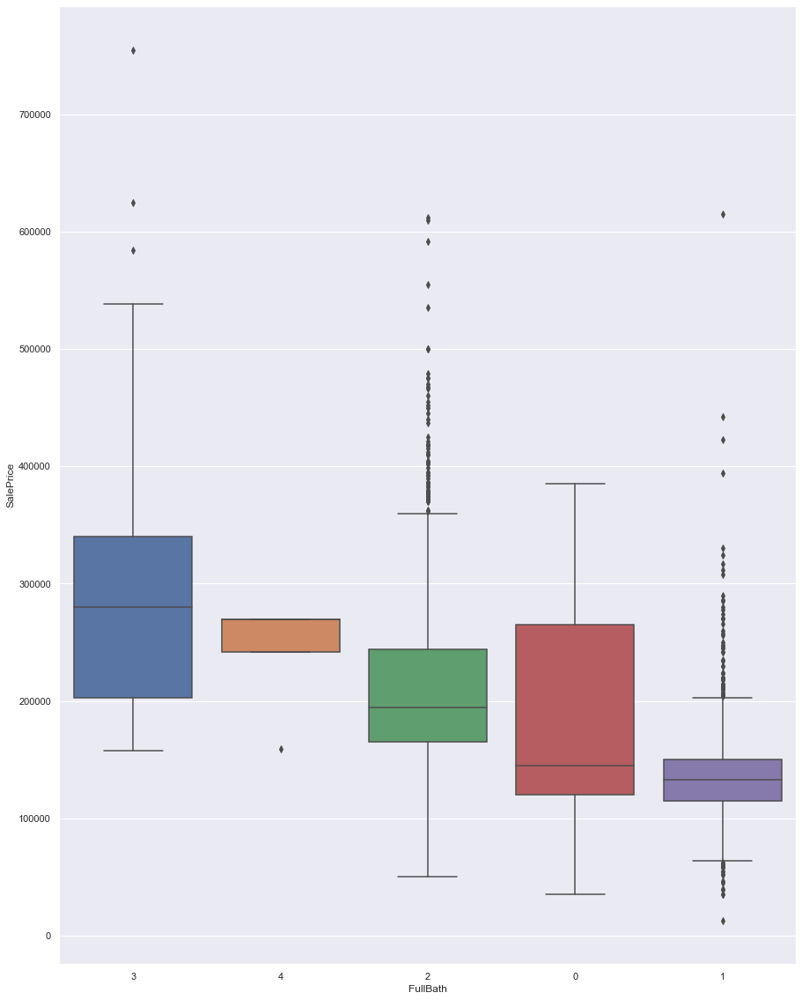

In [80]:
#FullBath
ordered=housing_fill_drop.groupby(by=["FullBath"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='FullBath', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='Functional', ylabel='SalePrice'>

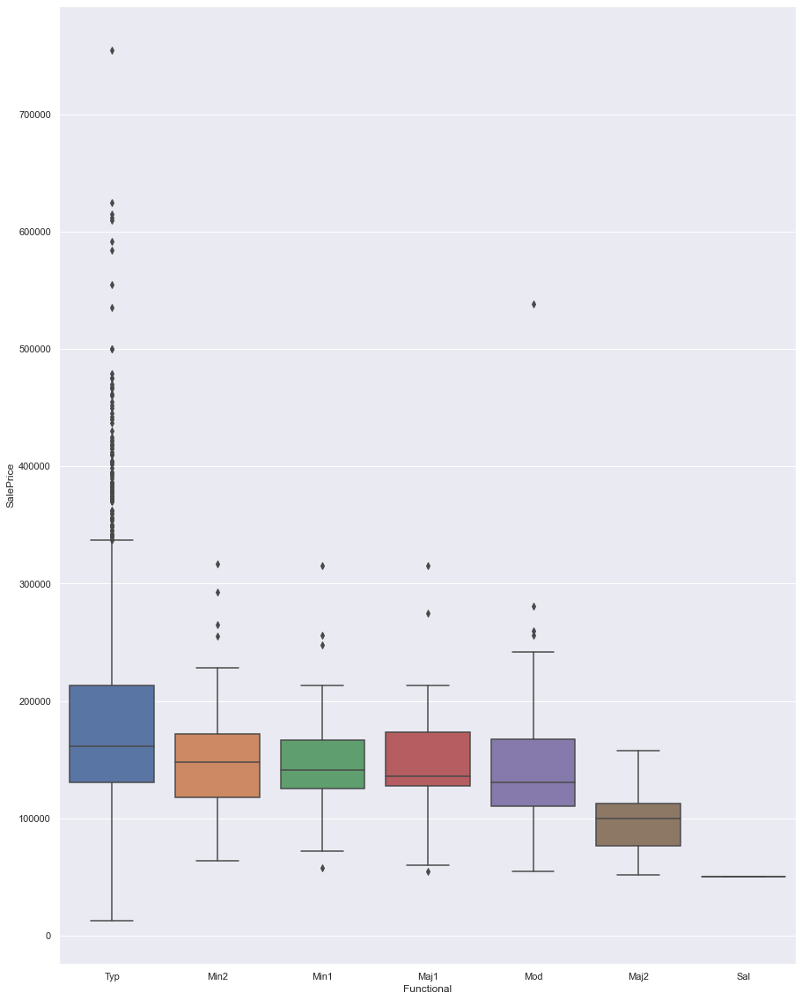

In [81]:
#Functional
ordered=housing_fill_drop.groupby(by=["Functional"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Functional', y='SalePrice', data= housing_fill_drop, order=ordered)

In [82]:
housing_fill_drop.Functional.value_counts()

Typ     2399
Min2      66
Min1      57
Mod       32
Maj1      18
Maj2       7
Sal        1
Name: Functional, dtype: int64

<AxesSubplot:xlabel='HalfBath', ylabel='SalePrice'>

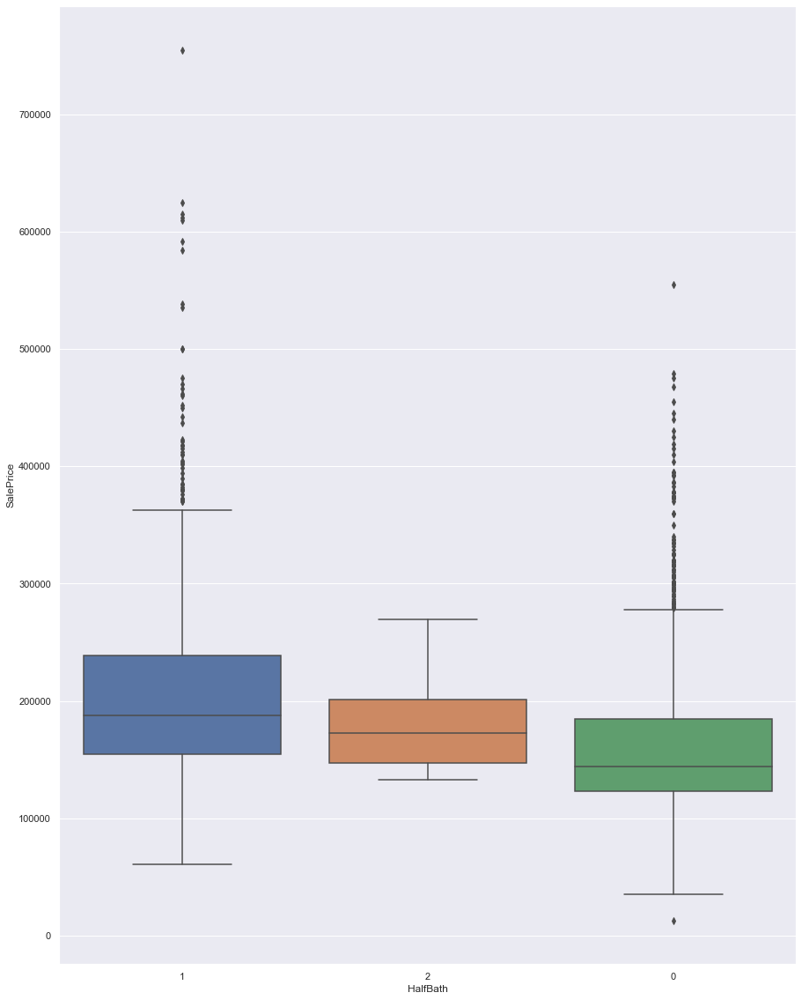

In [83]:
#HalfBath
ordered=housing_fill_drop.groupby(by=["HalfBath"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='HalfBath', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='Heating', ylabel='SalePrice'>

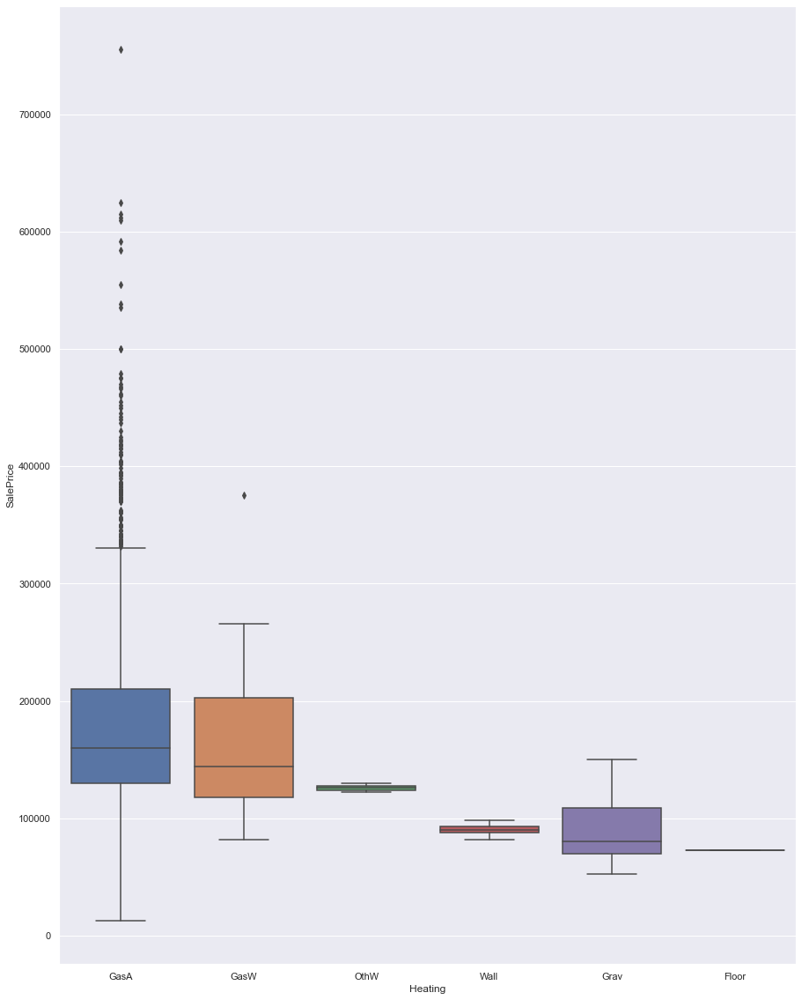

In [84]:
#HEATING
ordered=housing_fill_drop.groupby(by=["Heating"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Heating', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='HeatingQC', ylabel='SalePrice'>

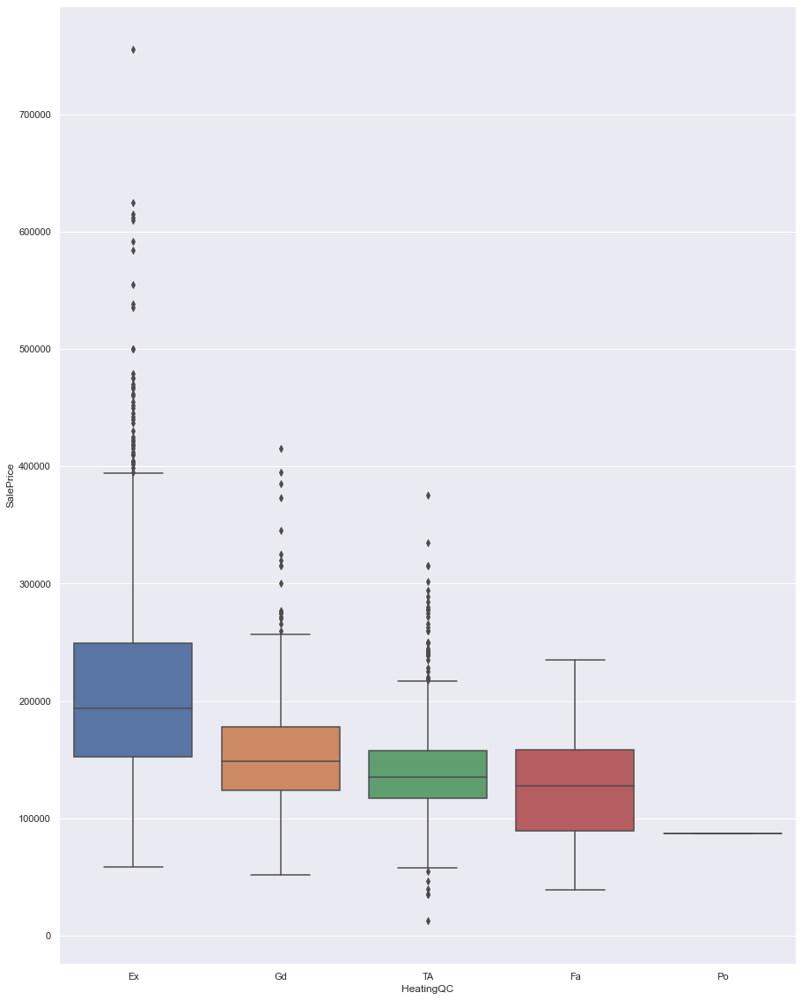

In [85]:
#HeatingQC
ordered=housing_fill_drop.groupby(by=["HeatingQC"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='HeatingQC', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='HouseStyle', ylabel='SalePrice'>

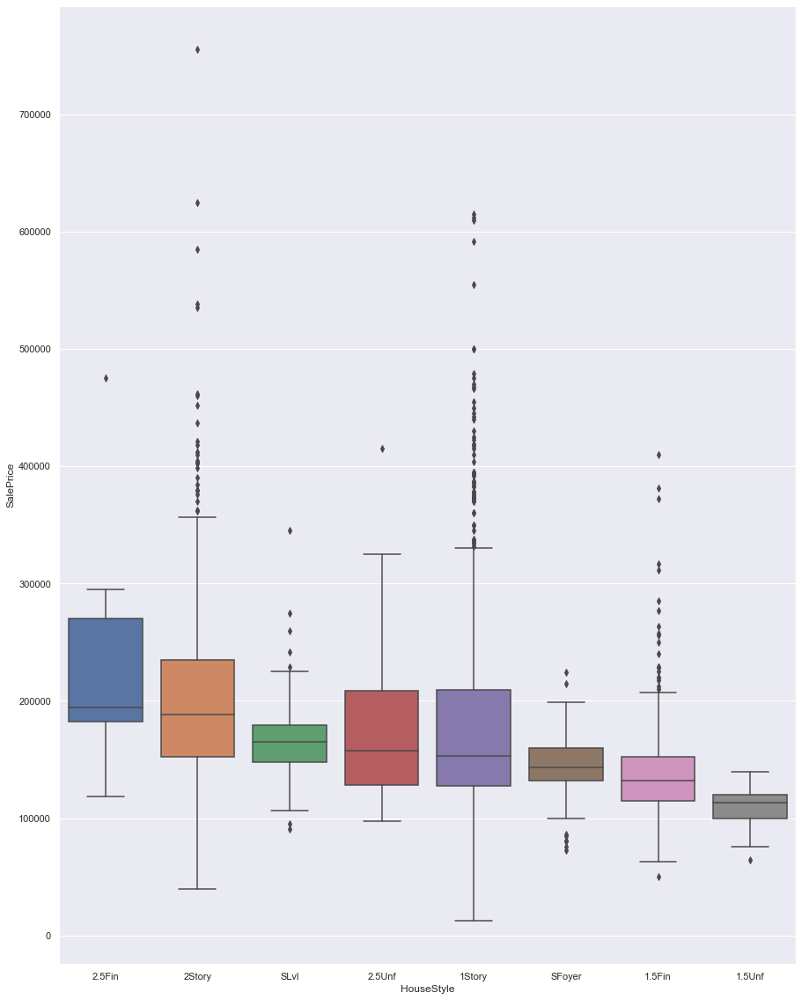

In [86]:
#HOUSEStyle
ordered=housing_fill_drop.groupby(by=["HouseStyle"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='HouseStyle', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='LandContour', ylabel='SalePrice'>

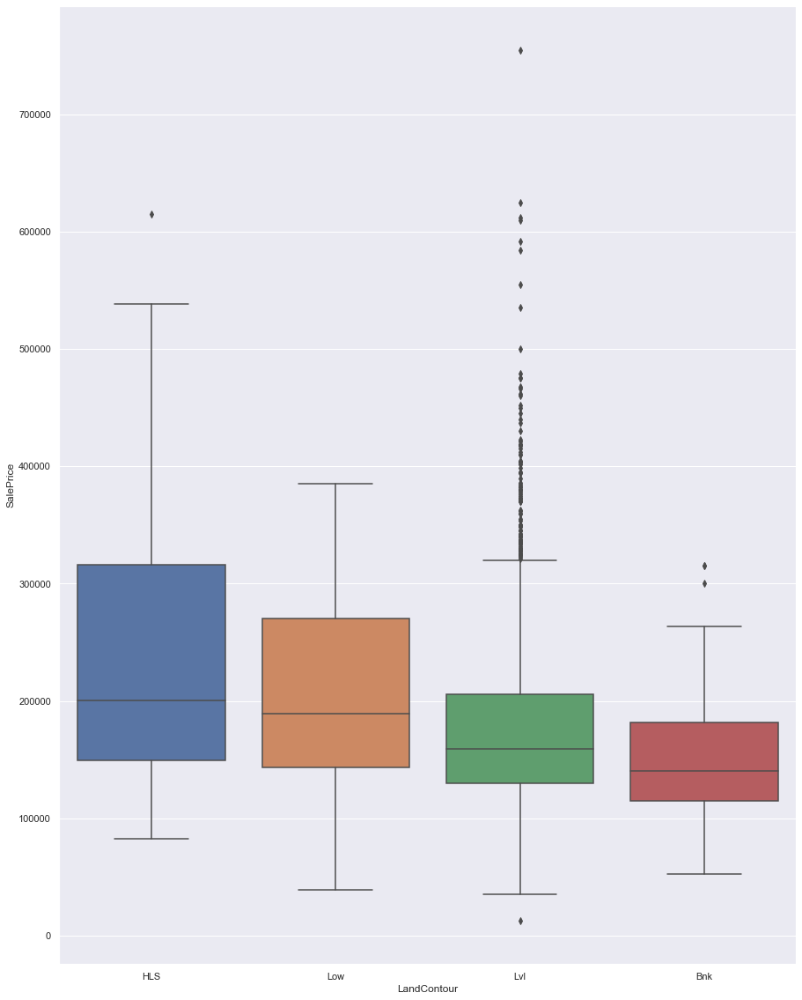

In [87]:
# LOT CHARCTERISTICS
ordered=housing_fill_drop.groupby(by=["LandContour"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='LandContour', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='LandSlope', ylabel='SalePrice'>

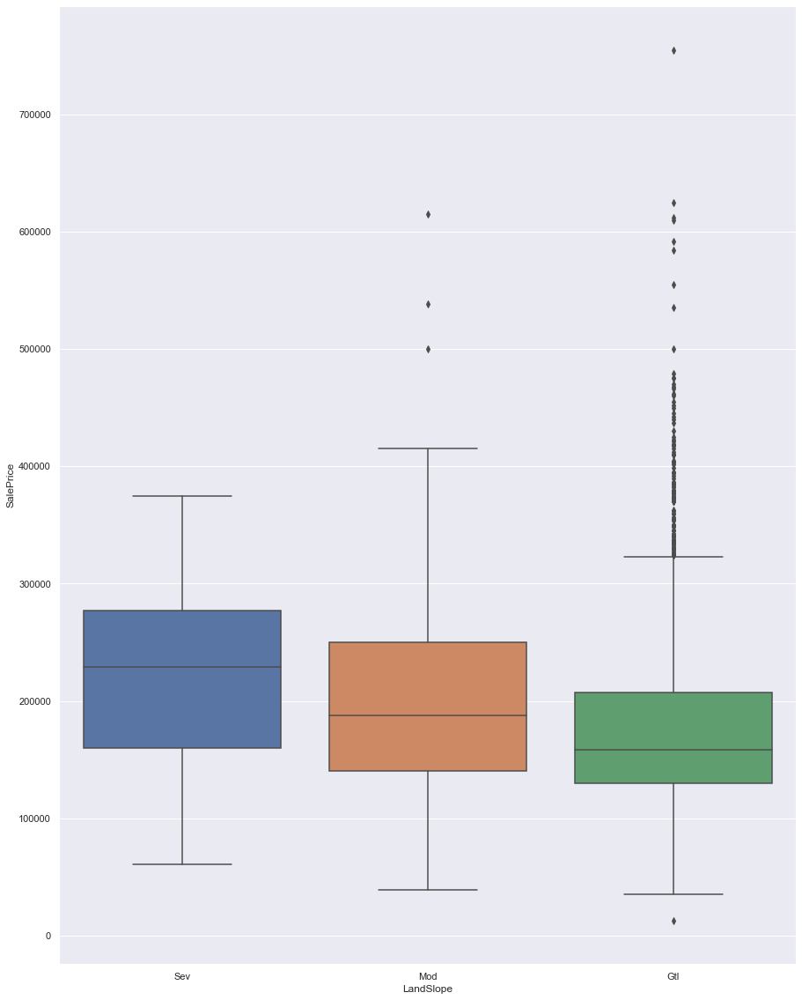

In [88]:
# LOT CHARCTERISTICS
ordered=housing_fill_drop.groupby(by=["LandSlope"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='LandSlope', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='LotConfig', ylabel='SalePrice'>

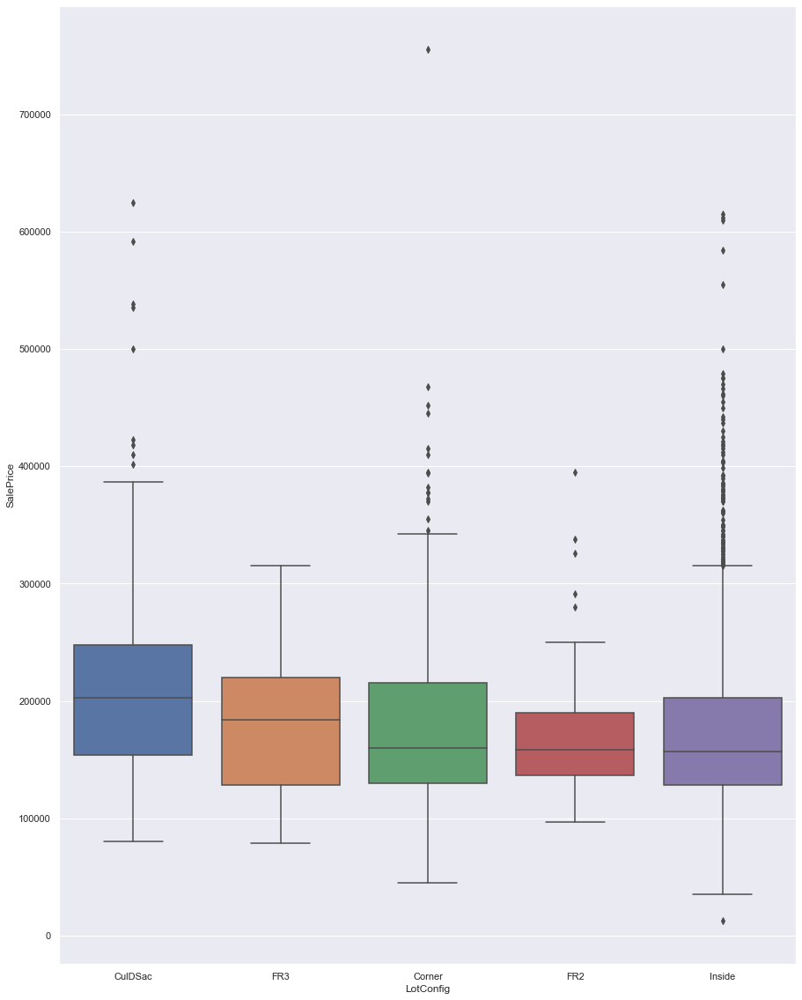

In [89]:
# LOT CHARCTERISTICS
ordered=housing_fill_drop.groupby(by=["LotConfig"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='LotConfig', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='LotShape', ylabel='SalePrice'>

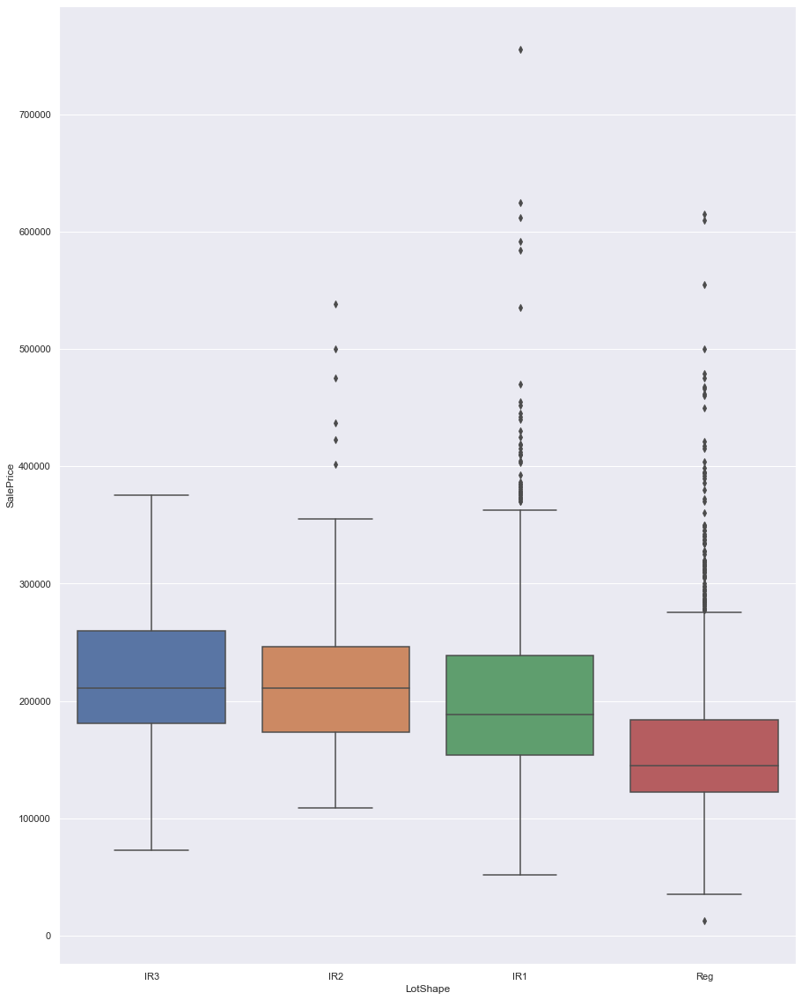

In [90]:
# LOT CHARCTERISTICS
ordered=housing_fill_drop.groupby(by=["LotShape"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='LotShape', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='MasVnrType', ylabel='SalePrice'>

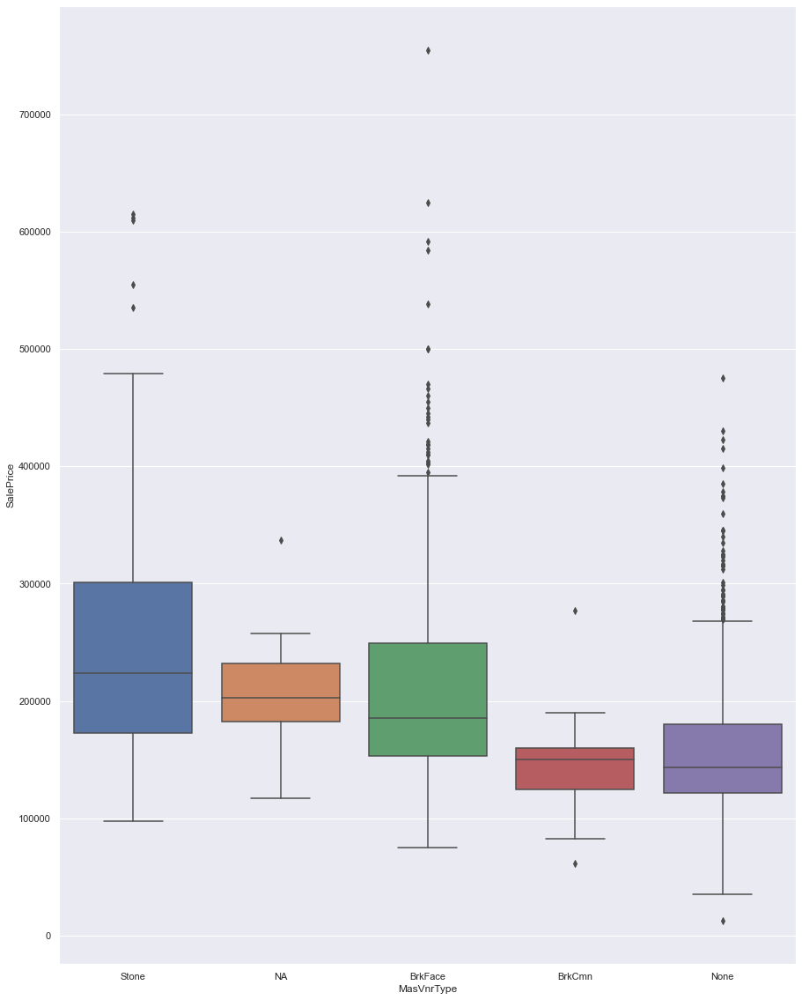

In [91]:
#MasVnrType
ordered=housing_fill_drop.groupby(by=["MasVnrType"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='MasVnrType', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='MSSubClass', ylabel='SalePrice'>

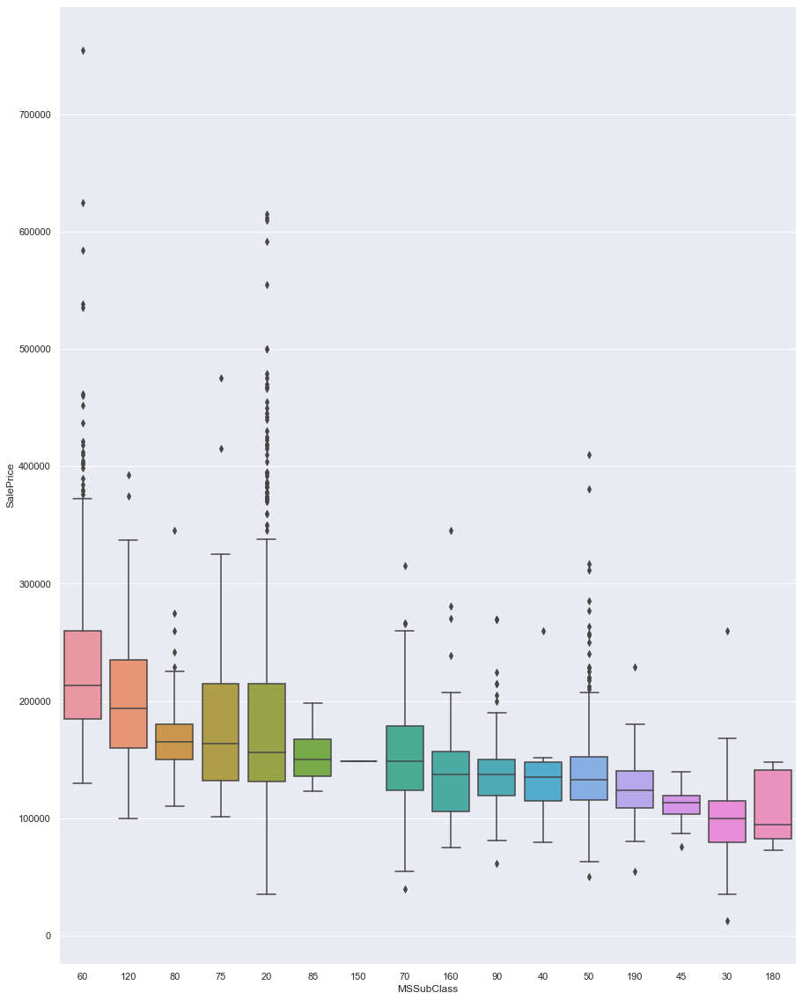

In [92]:
#MSSubClass
ordered=housing_fill_drop.groupby(by=["MSSubClass"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='MSSubClass', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='MSZoning', ylabel='SalePrice'>

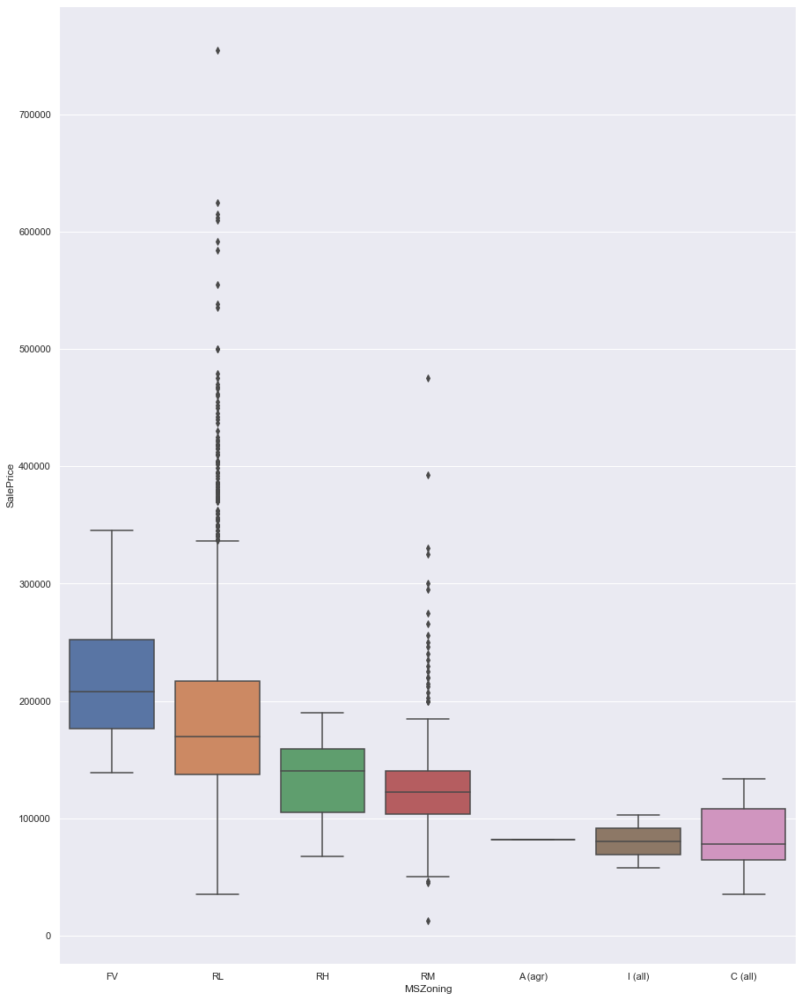

In [93]:
#NEIGHBORHOOD
ordered=housing_fill_drop.groupby(by=["MSZoning"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='MSZoning', y='SalePrice', data= housing_fill_drop, order=ordered)

In [94]:
housing['MasVnrType'].value_counts()

None       1559
BrkFace     804
Stone       183
BrkCmn       20
Name: MasVnrType, dtype: int64

<AxesSubplot:xlabel='Neighborhood', ylabel='SalePrice'>

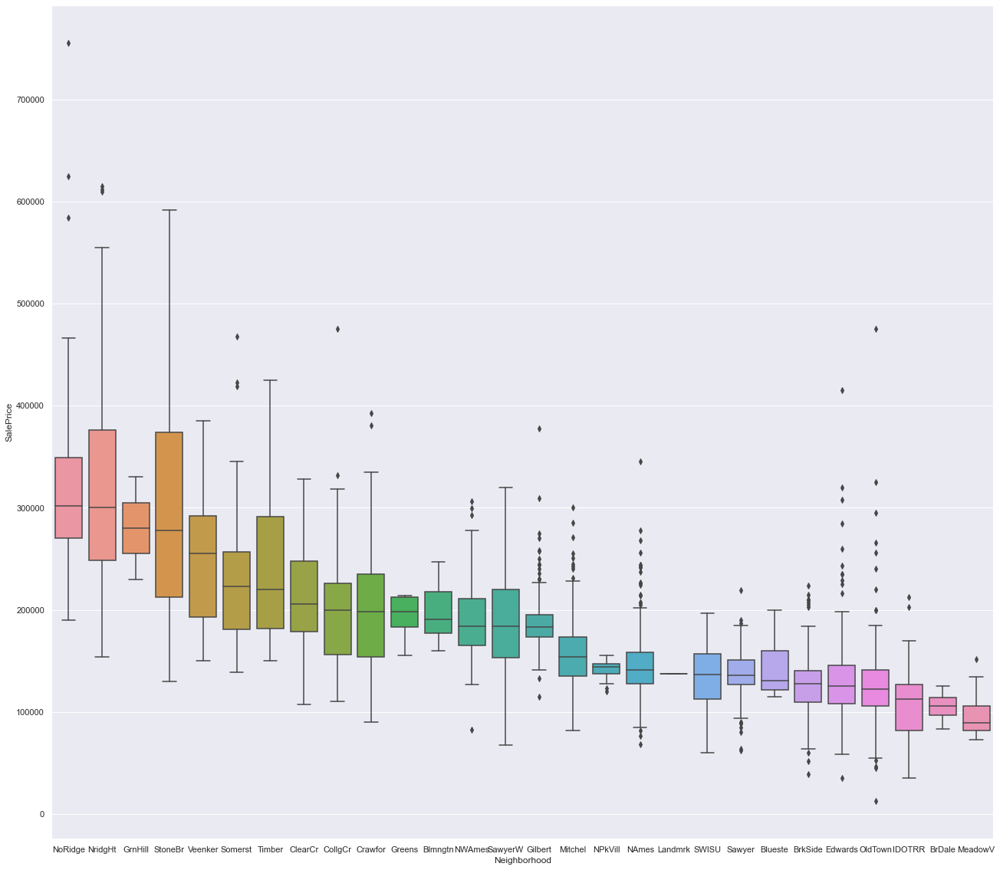

In [95]:
sns.set(rc={'figure.figsize':(22,20)})
ordered=housing_fill_drop.groupby(by=["Neighborhood"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Neighborhood', y='SalePrice', data= housing_fill_drop, order=ordered)

In [96]:
housing['Neighborhood'].value_counts()

NAmes      410
CollgCr    236
OldTown    213
Edwards    165
Gilbert    143
Somerst    143
Sawyer     139
NWAmes     123
NridgHt    121
SawyerW    113
Mitchel    104
BrkSide    103
Crawfor     93
IDOTRR      76
NoRidge     67
Timber      54
StoneBr     43
SWISU       42
ClearCr     40
MeadowV     34
BrDale      29
Blmngtn     23
Veenker     23
NPkVill     22
Blueste     10
Greens       8
GrnHill      2
Landmrk      1
Name: Neighborhood, dtype: int64

<AxesSubplot:xlabel='PavedDrive', ylabel='SalePrice'>

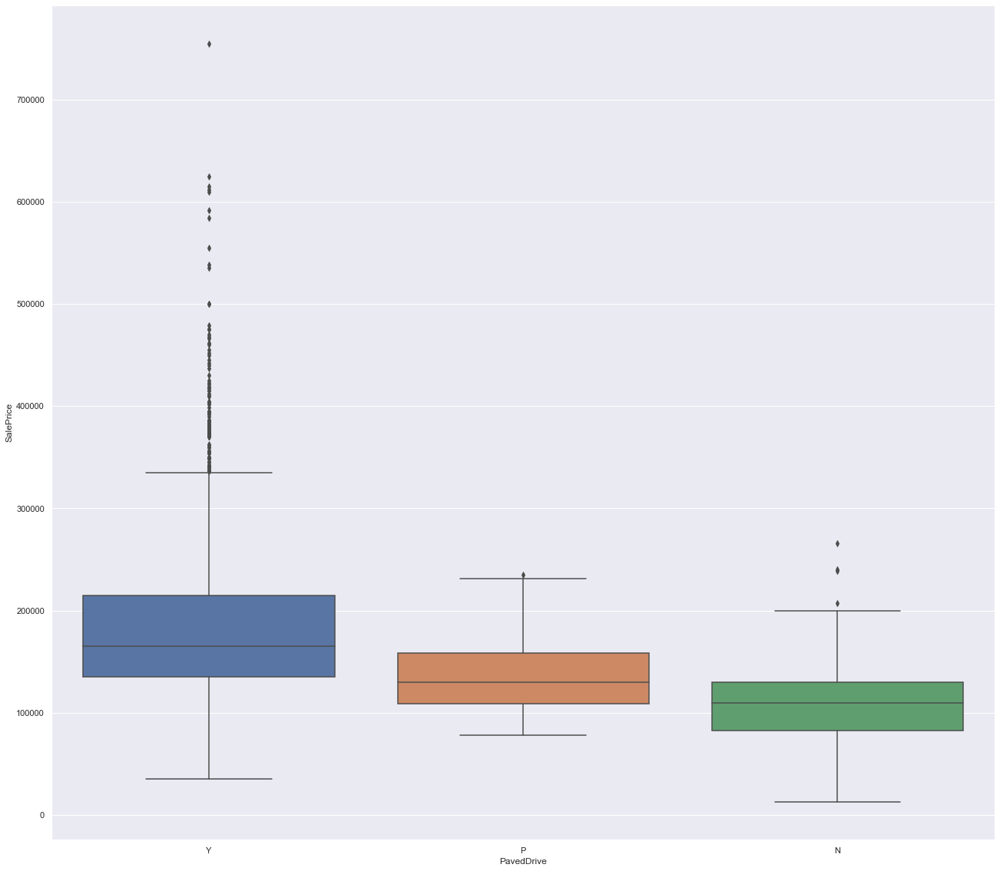

In [97]:
ordered=housing_fill_drop.groupby(by=["PavedDrive"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='PavedDrive', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='RoofMatl', ylabel='SalePrice'>

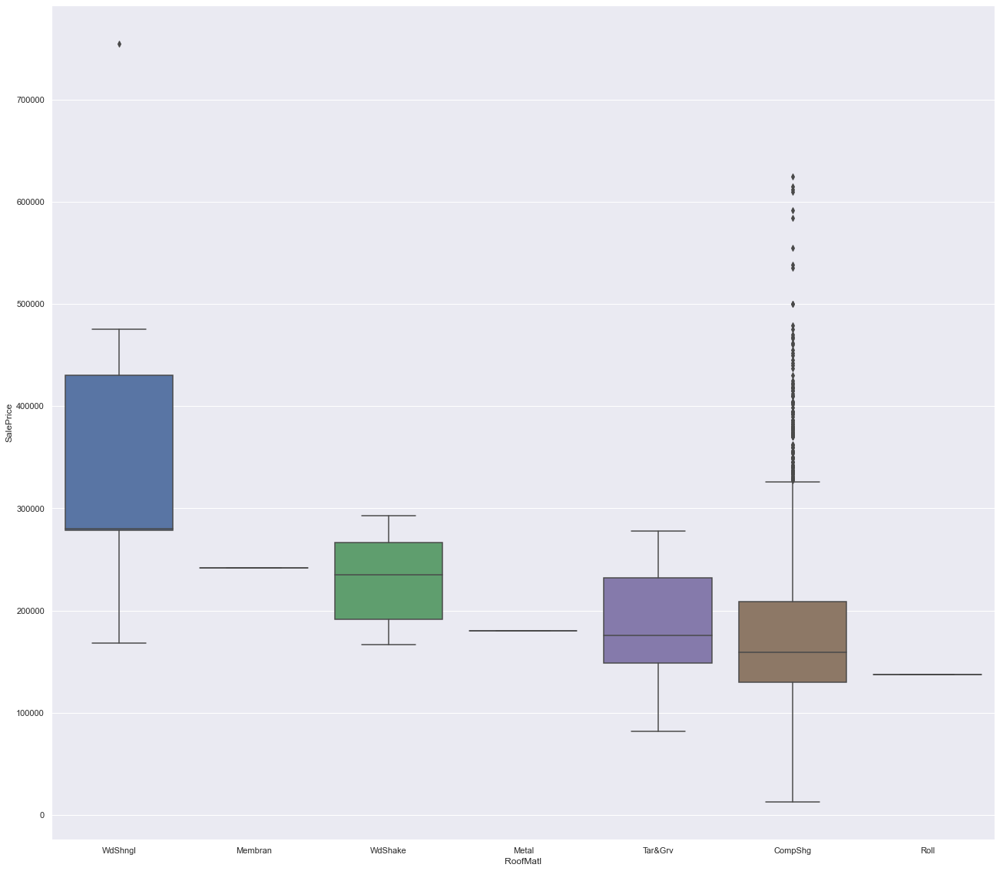

In [98]:
ordered=housing_fill_drop.groupby(by=["RoofMatl"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='RoofMatl', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='RoofStyle', ylabel='SalePrice'>

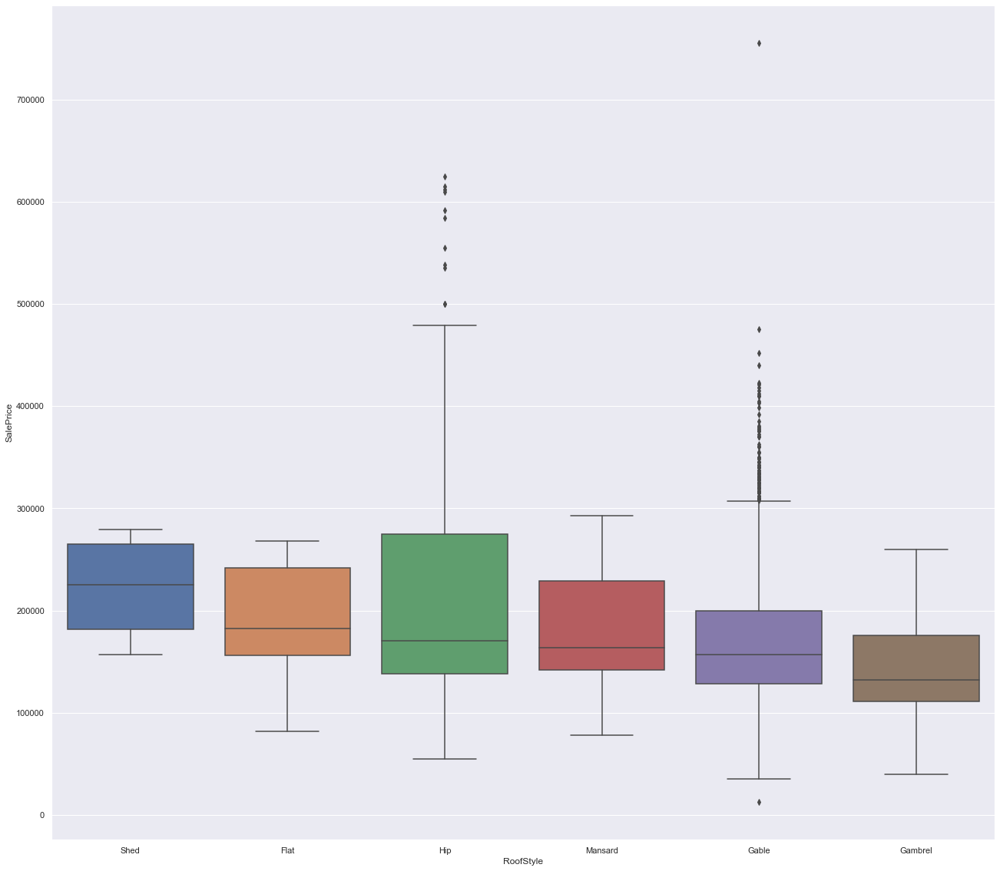

In [99]:
ordered=housing_fill_drop.groupby(by=["RoofStyle"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='RoofStyle', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='SaleCondition', ylabel='SalePrice'>

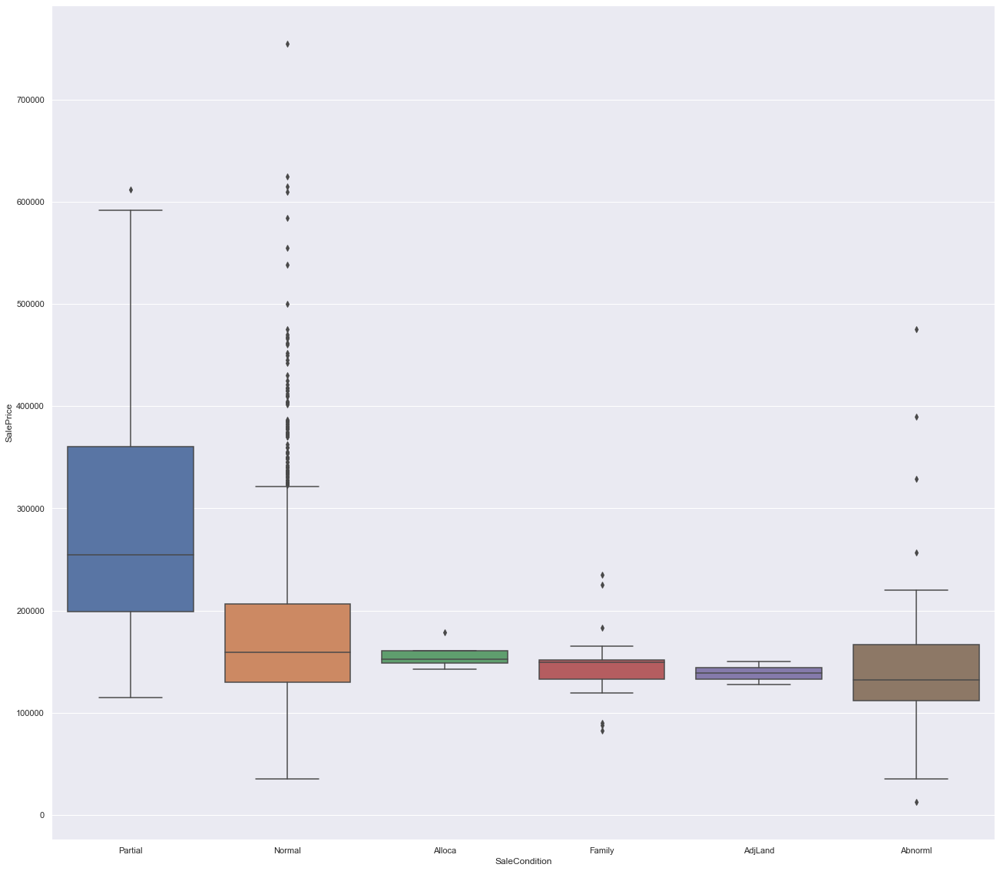

In [100]:
ordered=housing_fill_drop.groupby(by=["SaleCondition"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='SaleCondition', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='SaleType', ylabel='SalePrice'>

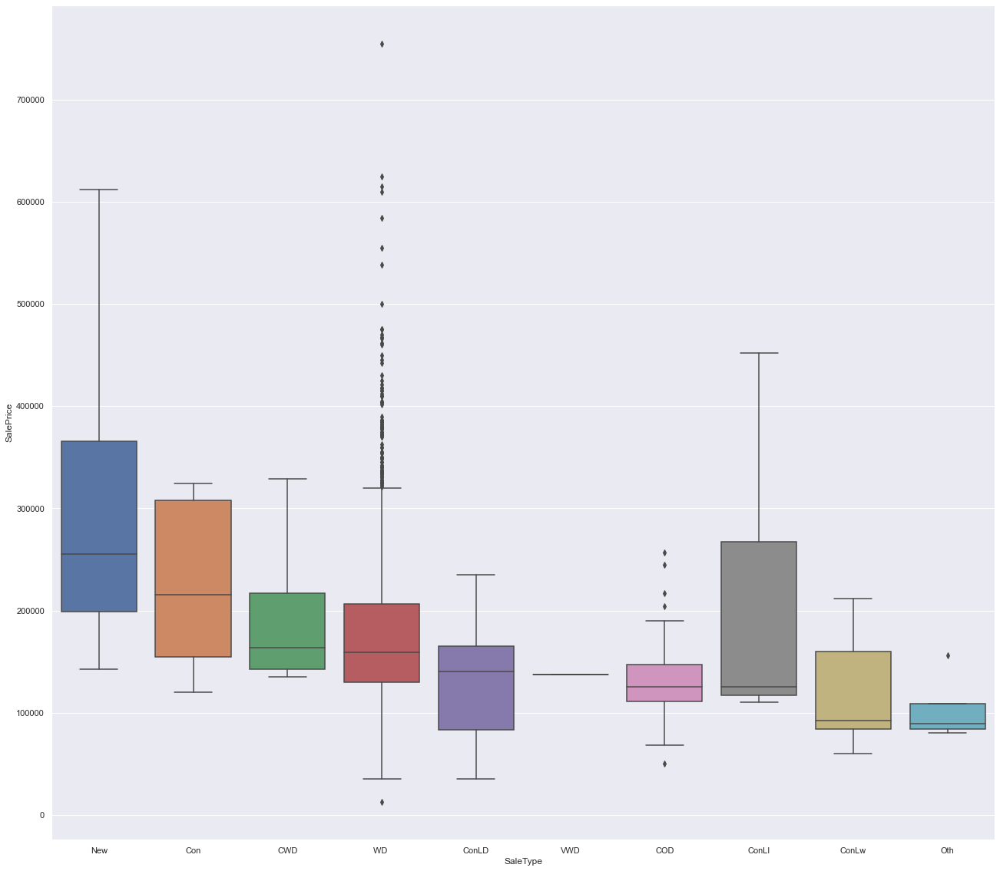

In [101]:
ordered=housing_fill_drop.groupby(by=["SaleType"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='SaleType', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='Street', ylabel='SalePrice'>

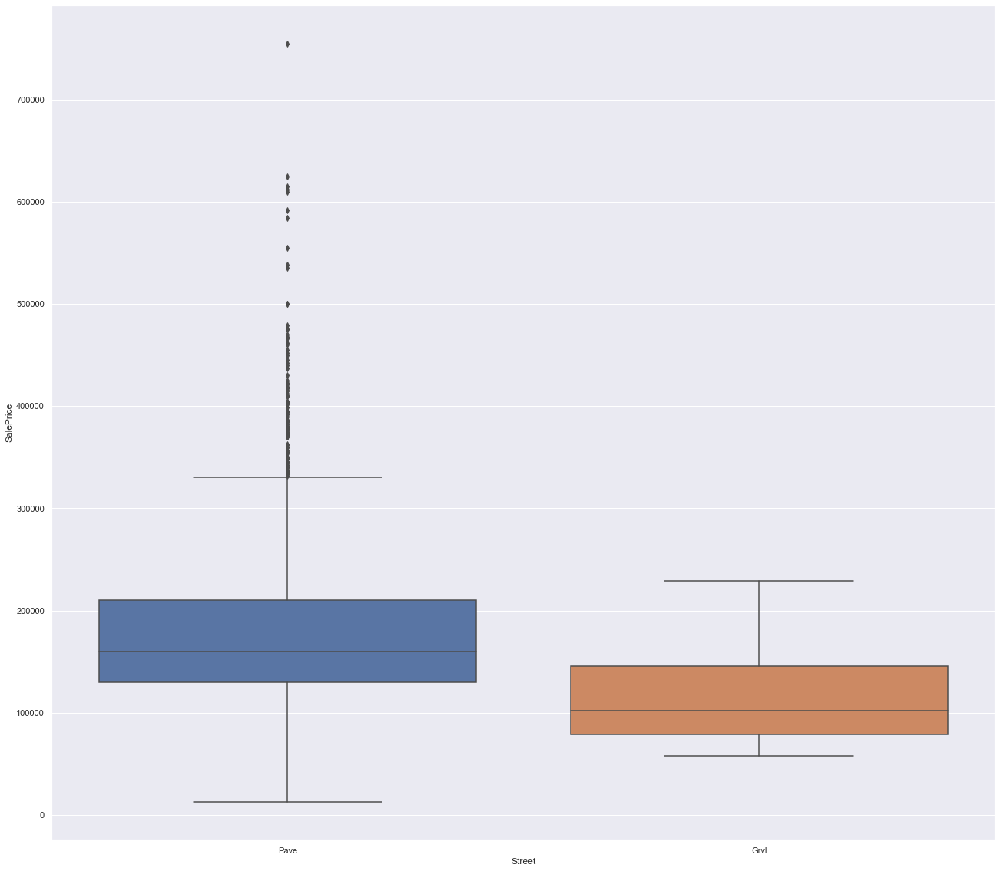

In [102]:
ordered=housing_fill_drop.groupby(by=["Street"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Street', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='Utilities', ylabel='SalePrice'>

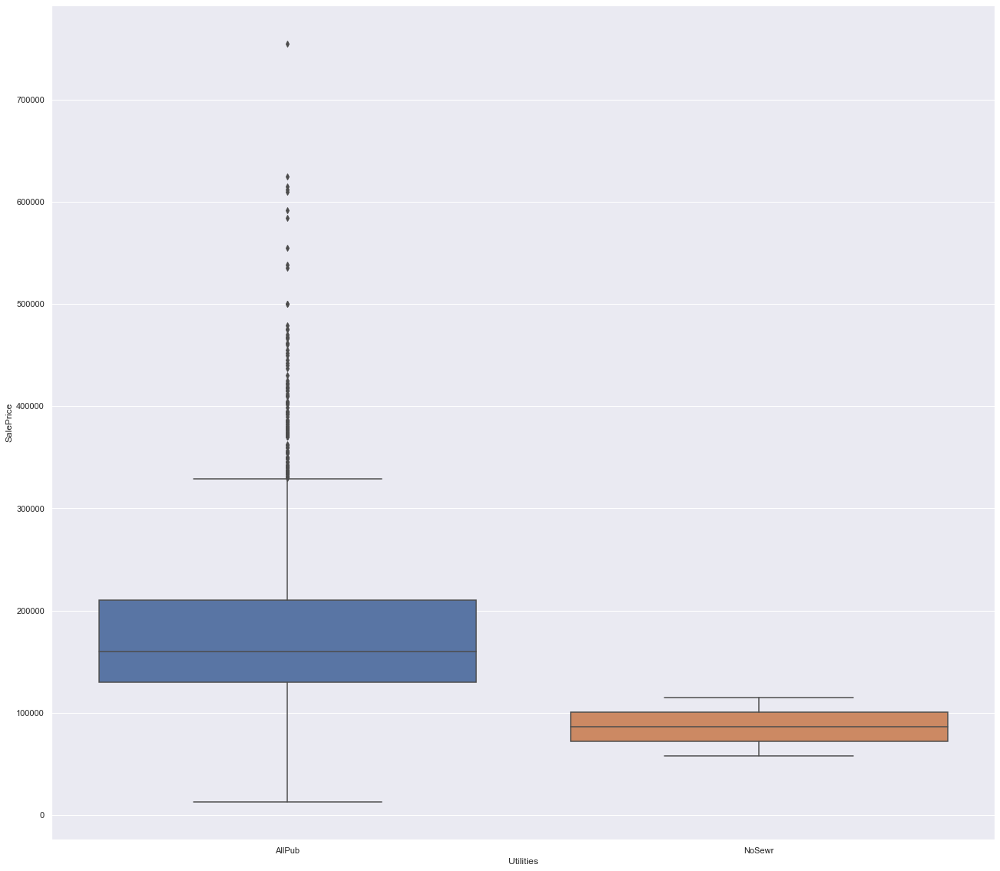

In [103]:
ordered=housing_fill_drop.groupby(by=["Utilities"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Utilities', y='SalePrice', data= housing_fill_drop, order=ordered)

<AxesSubplot:xlabel='Alley', ylabel='SalePrice'>

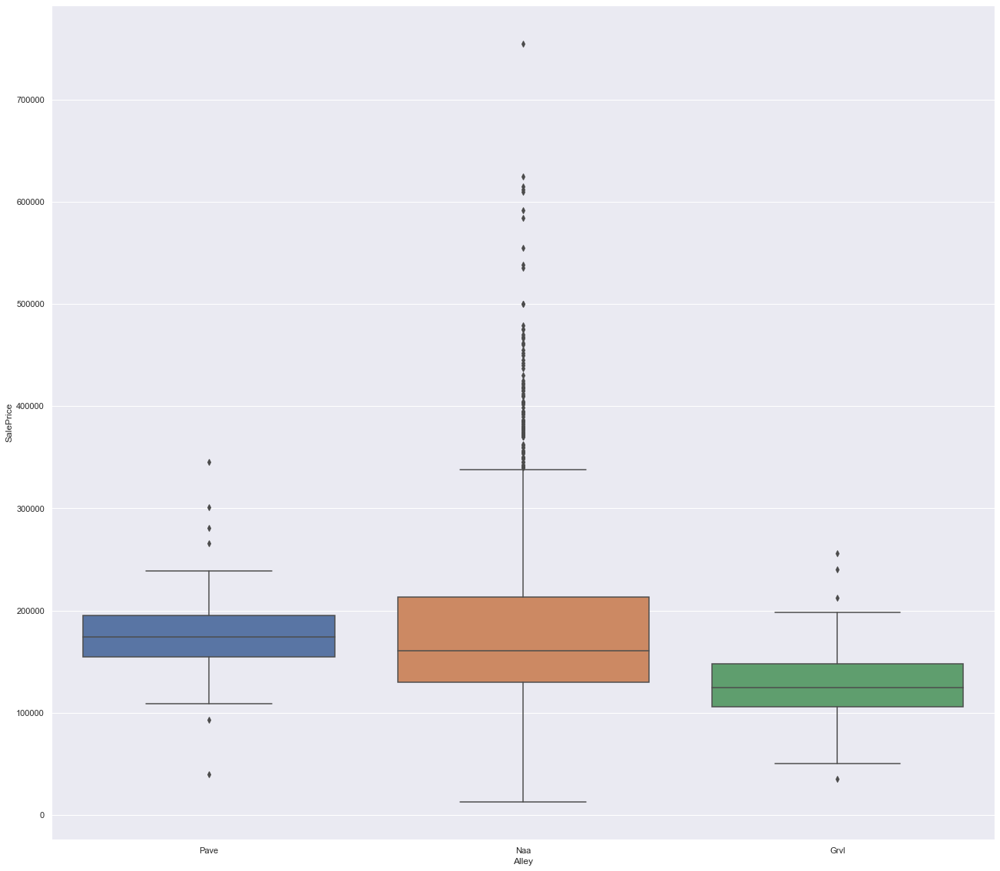

In [104]:
#Alley
ordered=housing_fill_drop.groupby(by=["Alley"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Alley', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='BldgType', ylabel='SalePrice'>

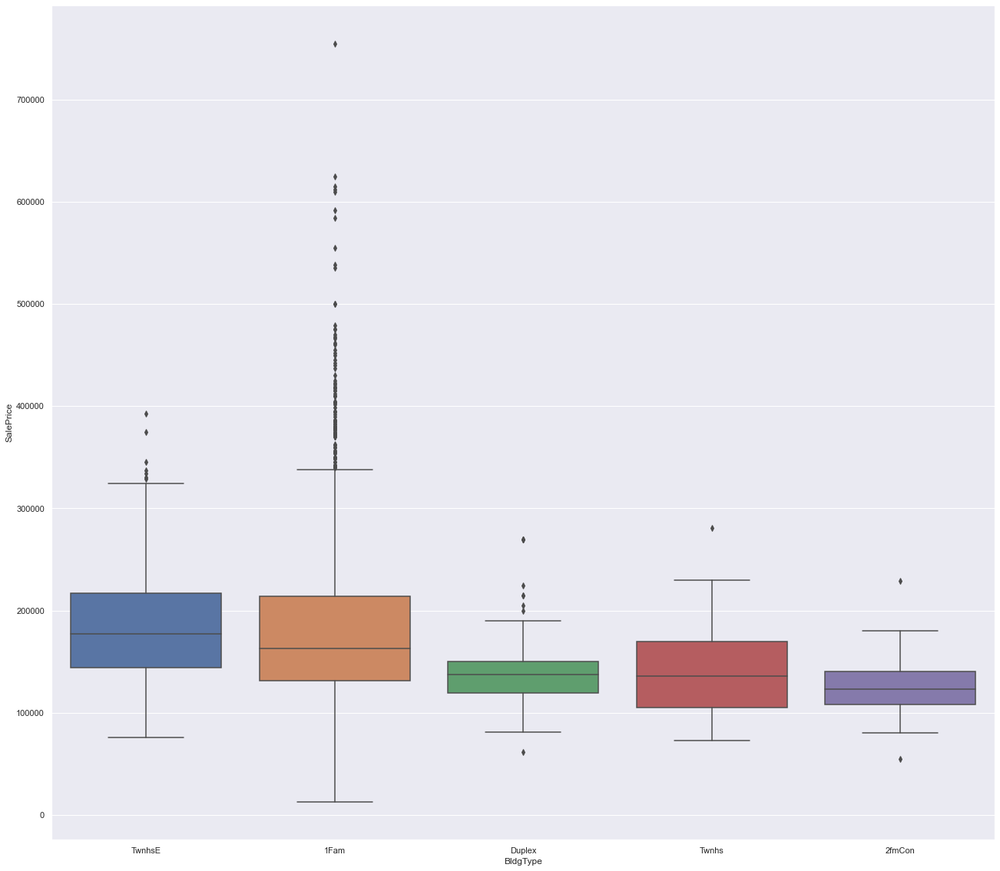

In [105]:
#Bldg Type
ordered=housing_fill_drop.groupby(by=["BldgType"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='BldgType', y='SalePrice', data= housing_fill_drop, order=ordered) 

In [106]:
housing_fill_drop['Alley'].value_counts()

Naa     2412
Grvl     105
Pave      63
Name: Alley, dtype: int64

<AxesSubplot:xlabel='BsmtCond', ylabel='SalePrice'>

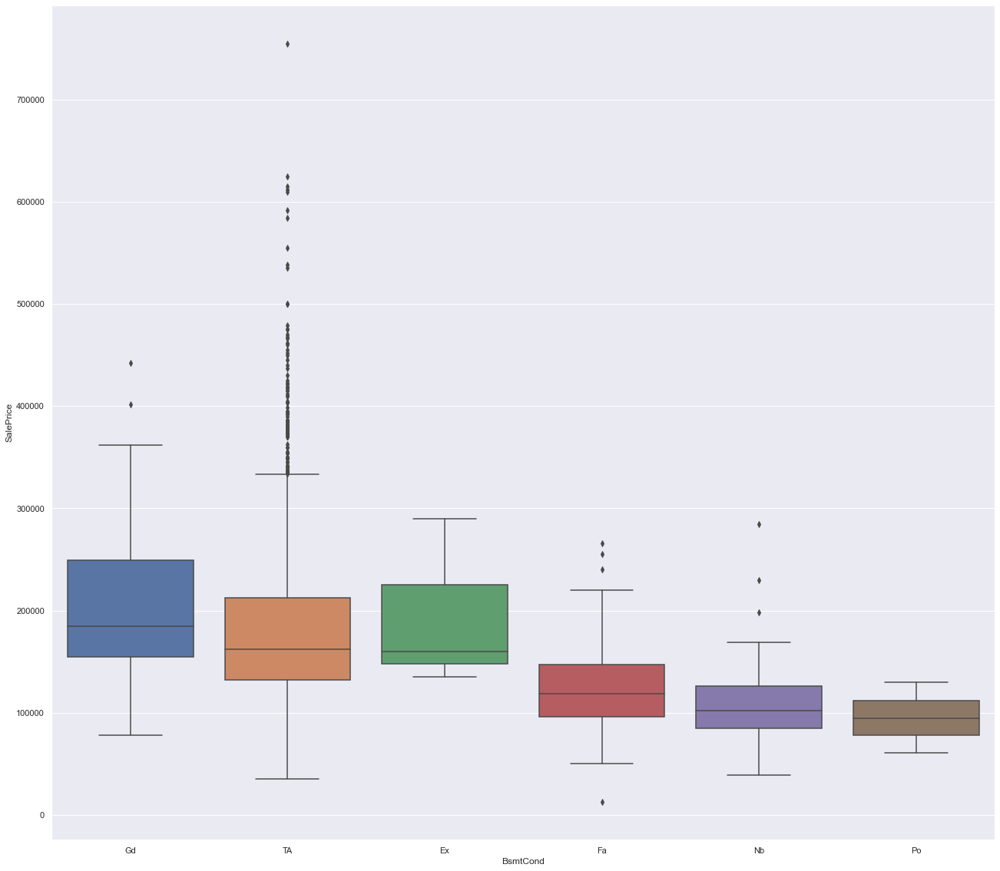

In [107]:
# BASEMENT
ordered=housing_fill_drop.groupby(by=["BsmtCond"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='BsmtCond', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='BsmtExposure', ylabel='SalePrice'>

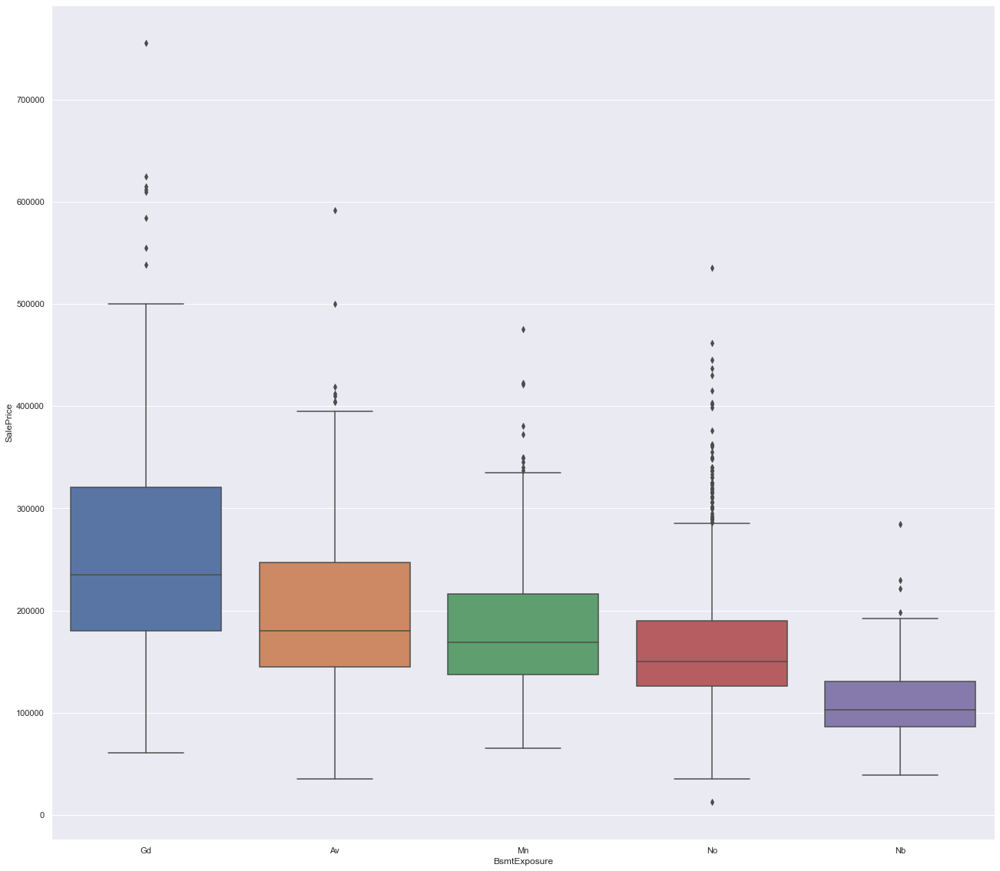

In [108]:
ordered=housing_fill_drop.groupby(by=["BsmtExposure"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='BsmtExposure', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='BsmtFinSF1', ylabel='SalePrice'>

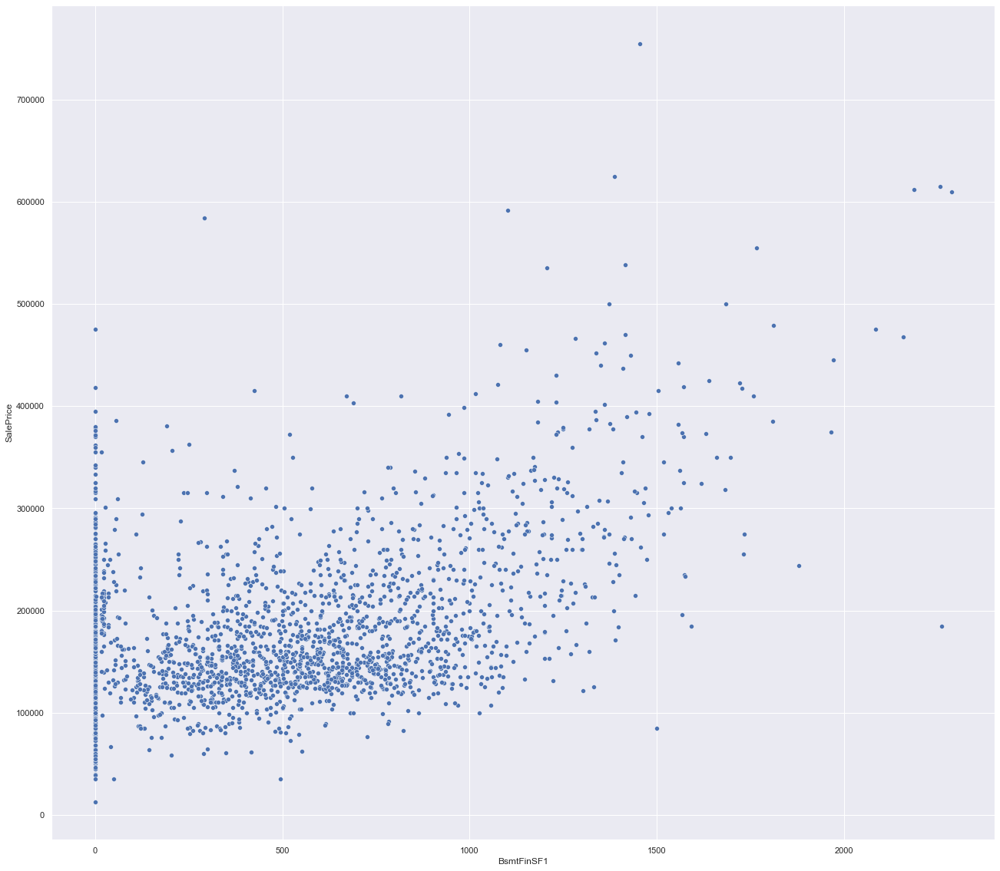

In [109]:
sns.scatterplot(x='BsmtFinSF1', y='SalePrice', data= housing_fill_drop) 

<AxesSubplot:xlabel='BsmtFinSF2', ylabel='SalePrice'>

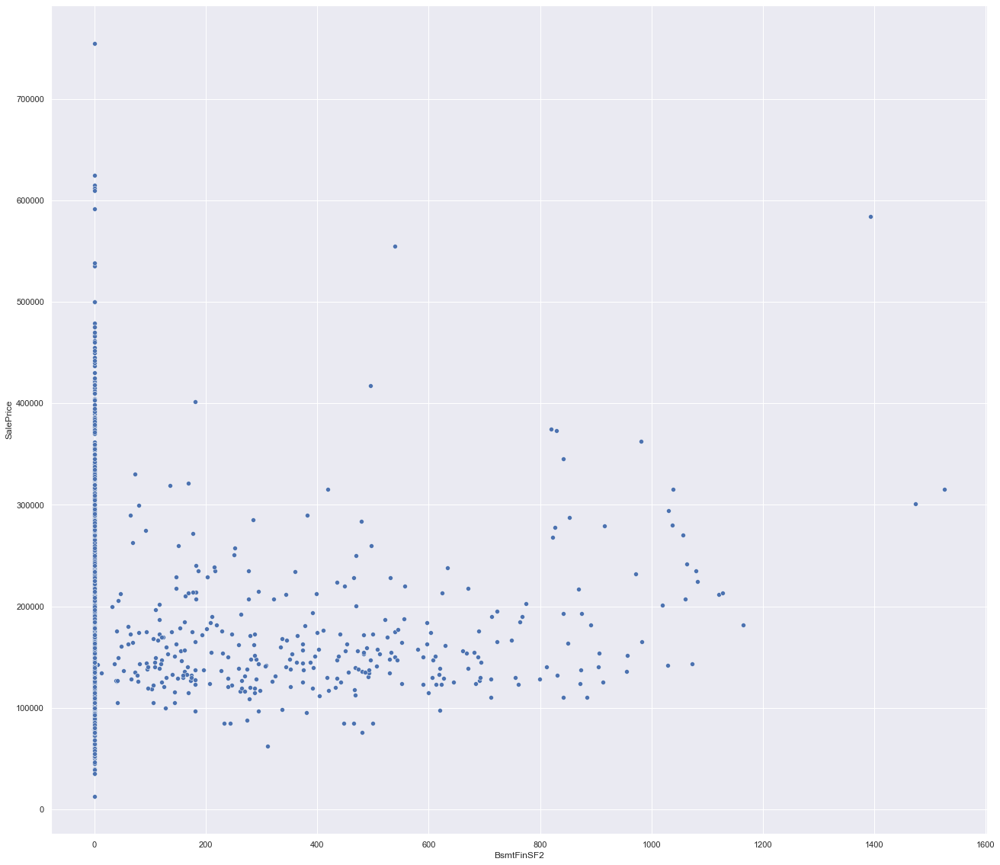

In [110]:
sns.scatterplot(x='BsmtFinSF2', y='SalePrice', data= housing_fill_drop) 

<AxesSubplot:xlabel='BsmtUnfSF', ylabel='SalePrice'>

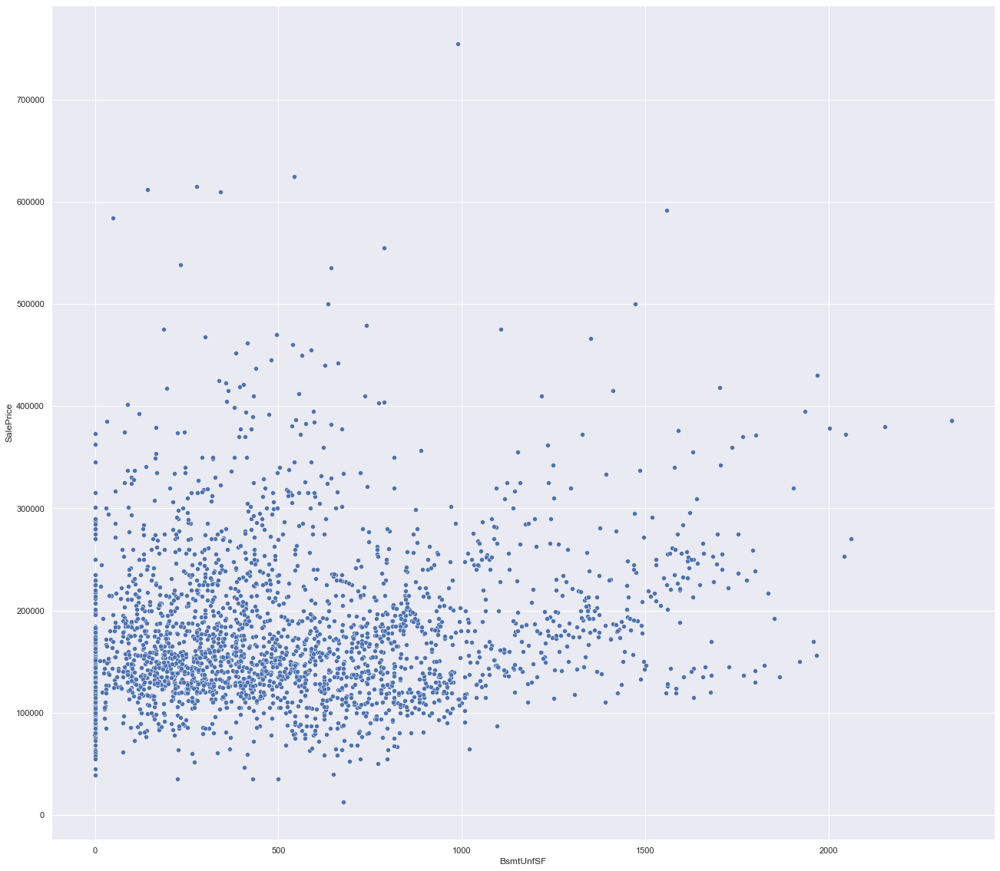

In [111]:
sns.scatterplot(x='BsmtUnfSF', y='SalePrice', data= housing_fill_drop) 

<AxesSubplot:xlabel='TotalBsmtSF', ylabel='SalePrice'>

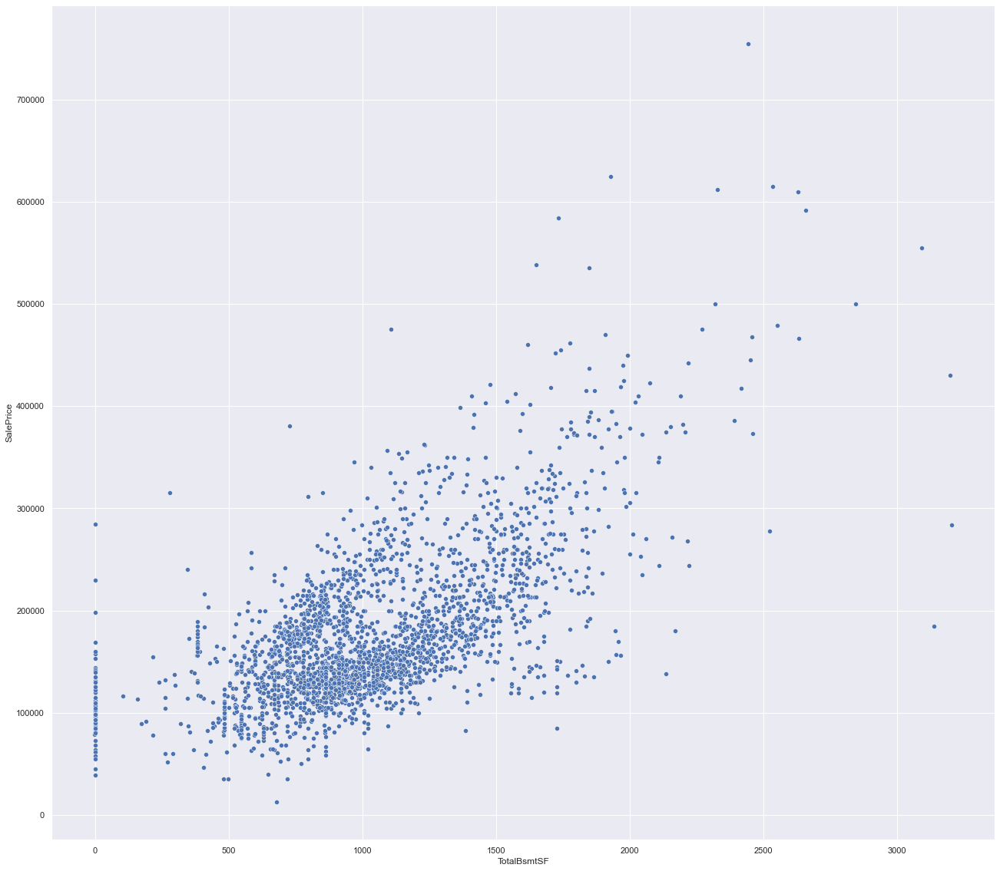

In [112]:
sns.scatterplot(x='TotalBsmtSF', y='SalePrice', data= housing_fill_drop) 

<AxesSubplot:xlabel='BsmtFinType1', ylabel='SalePrice'>

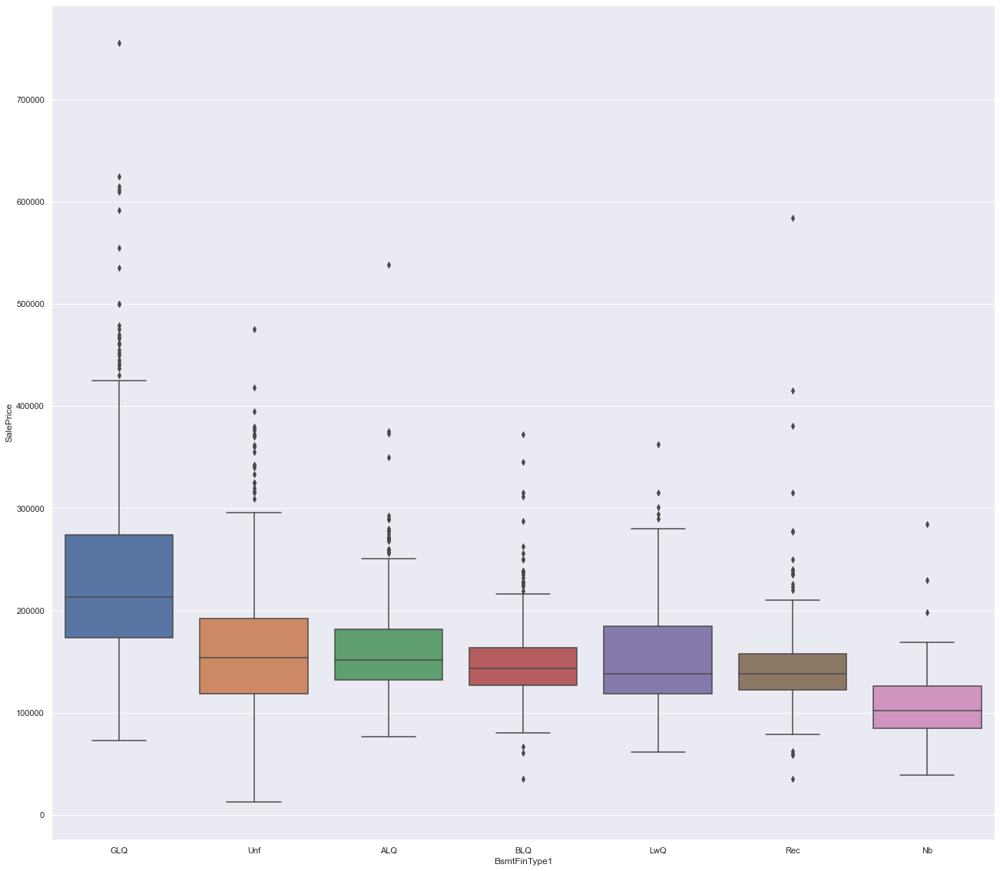

In [113]:
ordered=housing_fill_drop.groupby(by=["BsmtFinType1"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='BsmtFinType1', y='SalePrice', data= housing_fill_drop, order=ordered) 

In [114]:
housing_fill_drop['BsmtFinType1'].value_counts()

GLQ    753
Unf    706
ALQ    397
Rec    265
BLQ    251
LwQ    139
Nb      69
Name: BsmtFinType1, dtype: int64

<AxesSubplot:xlabel='BsmtFinType2', ylabel='SalePrice'>

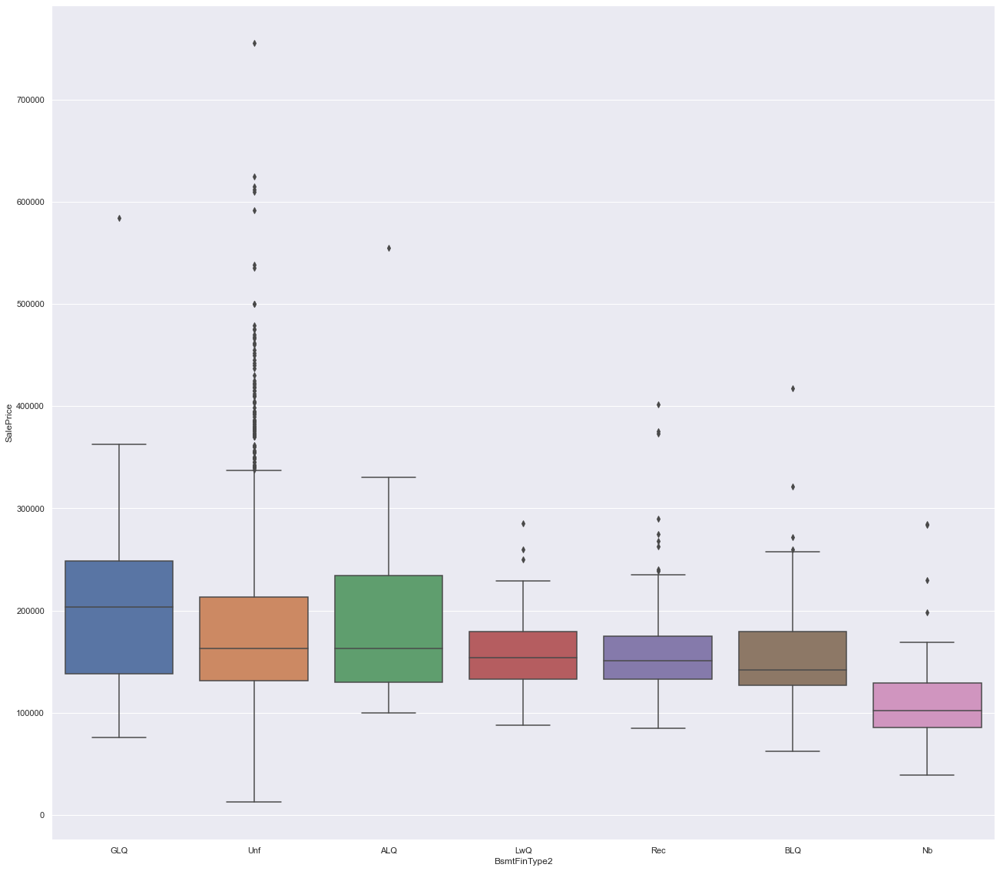

In [115]:
ordered=housing_fill_drop.groupby(by=["BsmtFinType2"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='BsmtFinType2', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='BsmtQual', ylabel='SalePrice'>

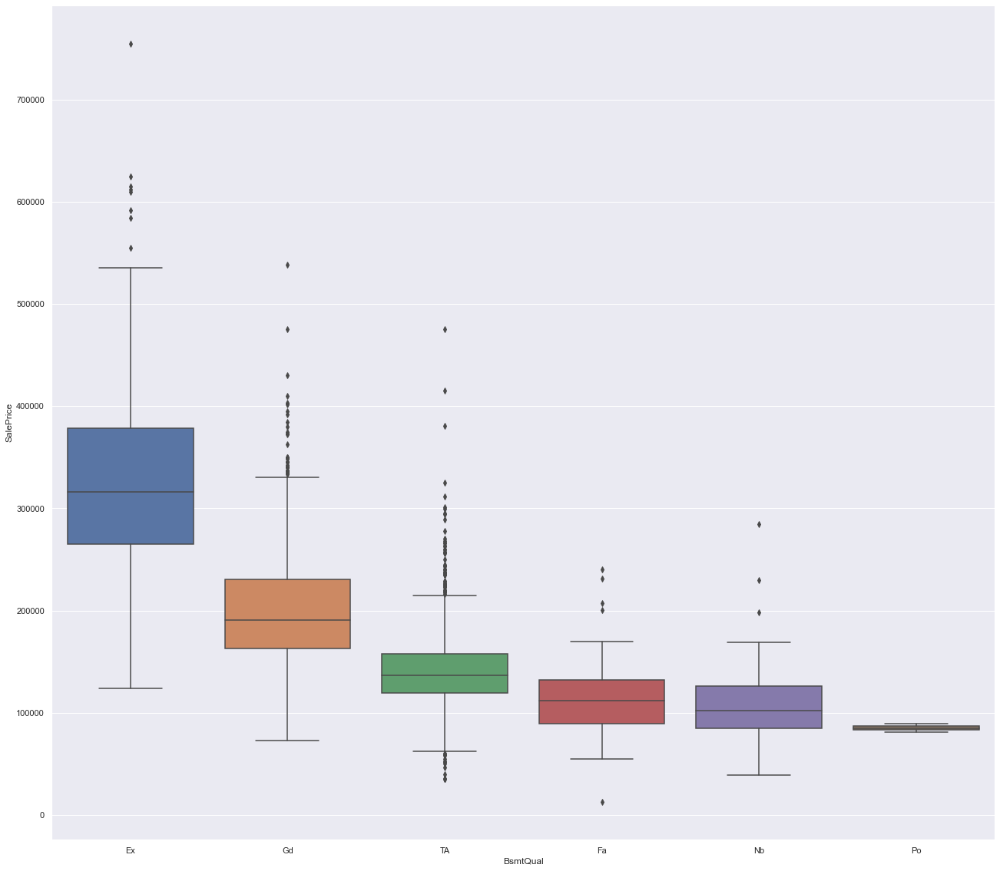

In [116]:
ordered=housing_fill_drop.groupby(by=["BsmtQual"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='BsmtQual', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='CentralAir', ylabel='SalePrice'>

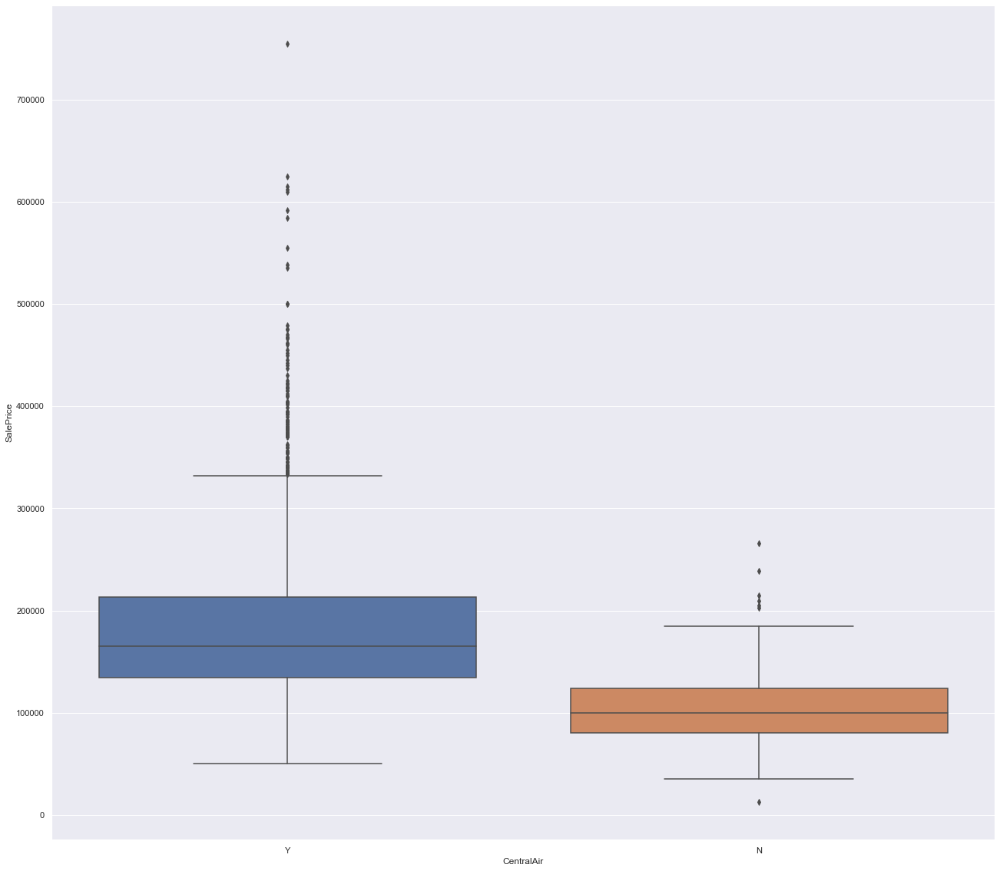

In [117]:
#CENTRAL AIR
ordered=housing_fill_drop.groupby(by=["CentralAir"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='CentralAir', y='SalePrice', data= housing_fill_drop, order=ordered) 

In [118]:
housing_fill_drop['CentralAir'].value_counts()

Y    2417
N     163
Name: CentralAir, dtype: int64

<AxesSubplot:xlabel='Condition1', ylabel='SalePrice'>

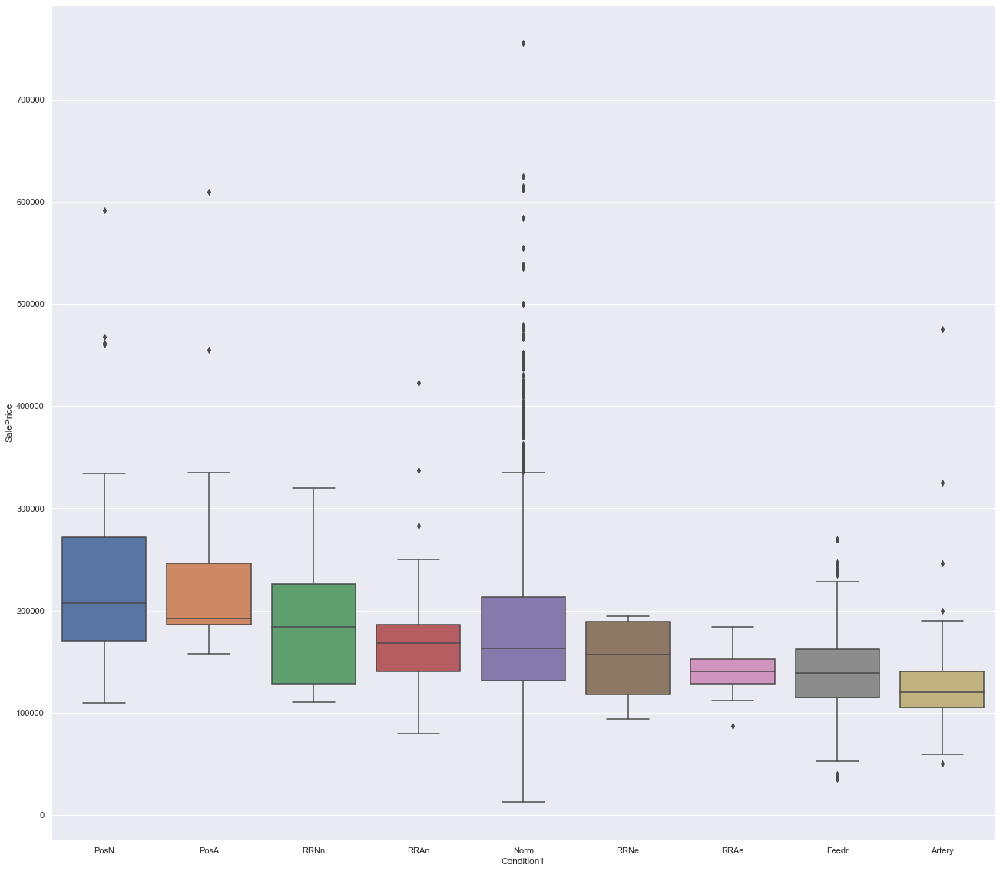

In [119]:
#Condition1
ordered=housing_fill_drop.groupby(by=["Condition1"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Condition1', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='Condition2', ylabel='SalePrice'>

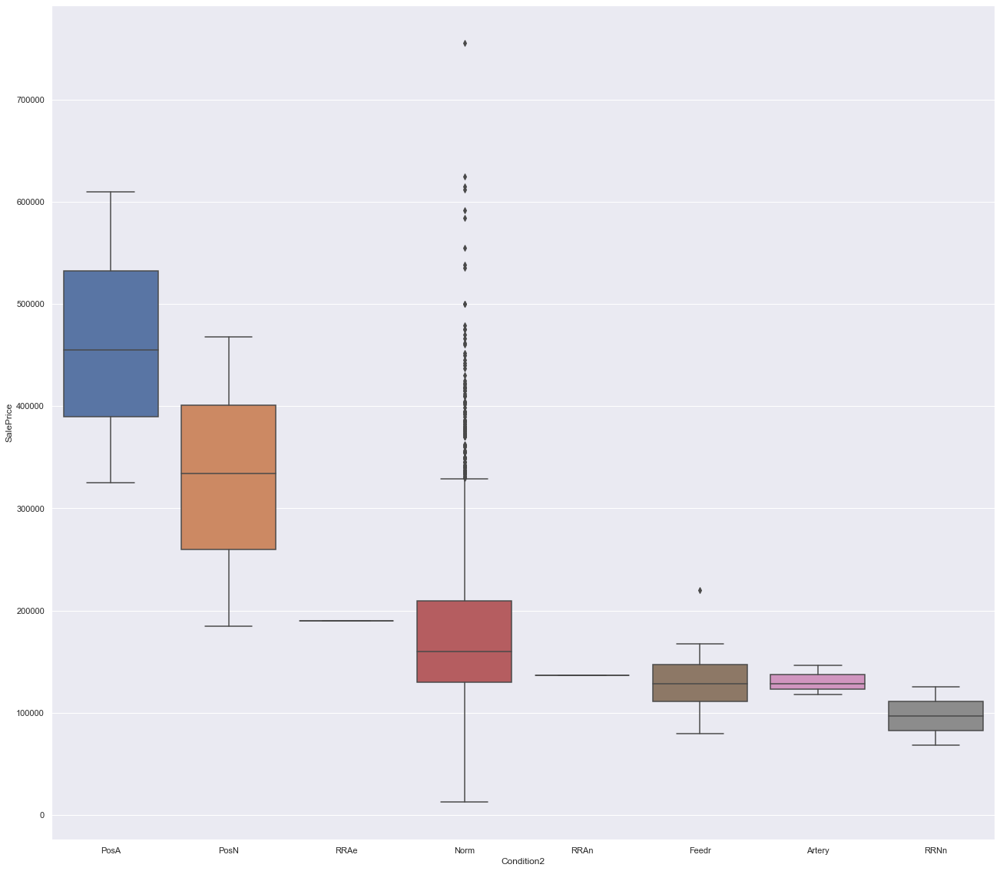

In [120]:
#Condition2
ordered=housing_fill_drop.groupby(by=["Condition2"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Condition2', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='Electrical', ylabel='SalePrice'>

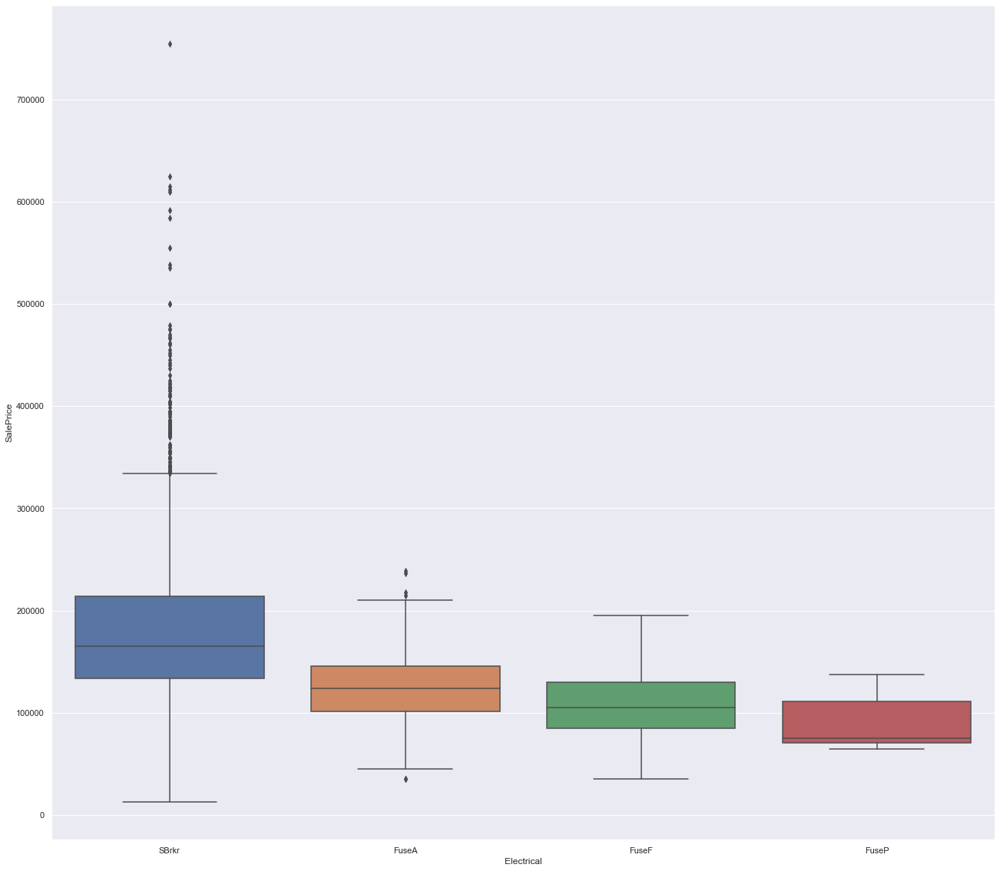

In [121]:
#Electrical
ordered=housing_fill_drop.groupby(by=["Electrical"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Electrical', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='ExterCond', ylabel='SalePrice'>

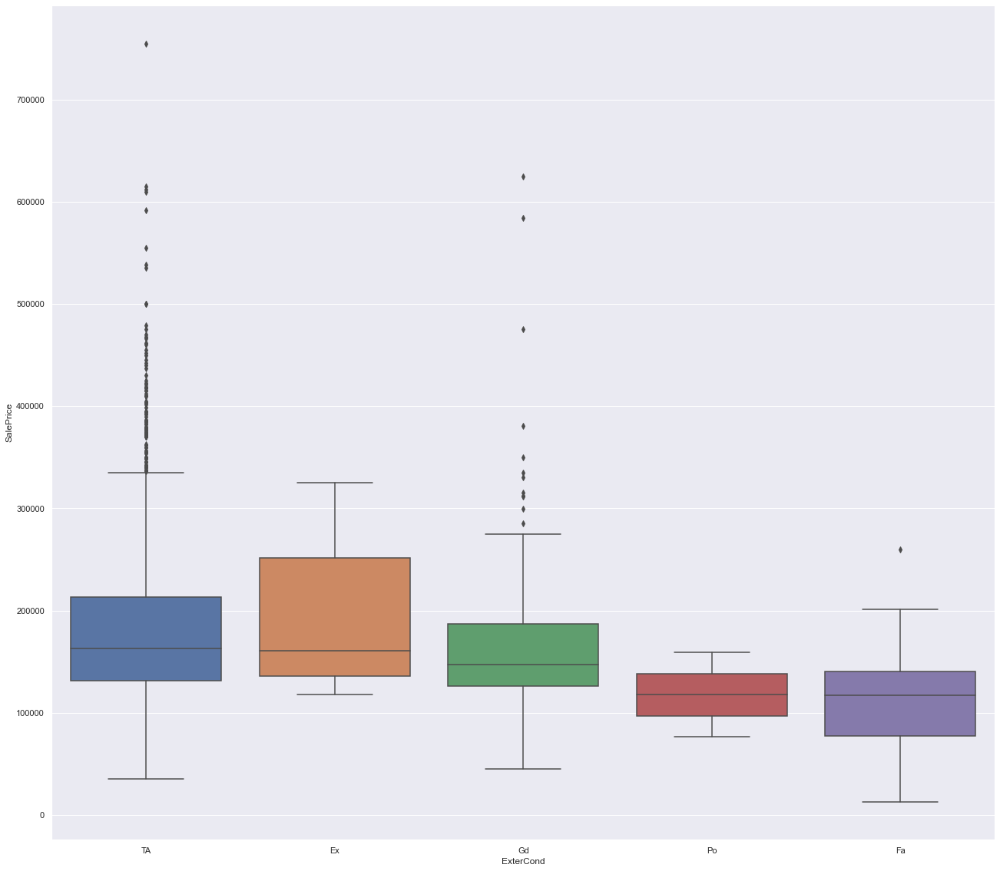

In [122]:
#External COnidtion
ordered=housing_fill_drop.groupby(by=["ExterCond"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='ExterCond', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='ExterQual', ylabel='SalePrice'>

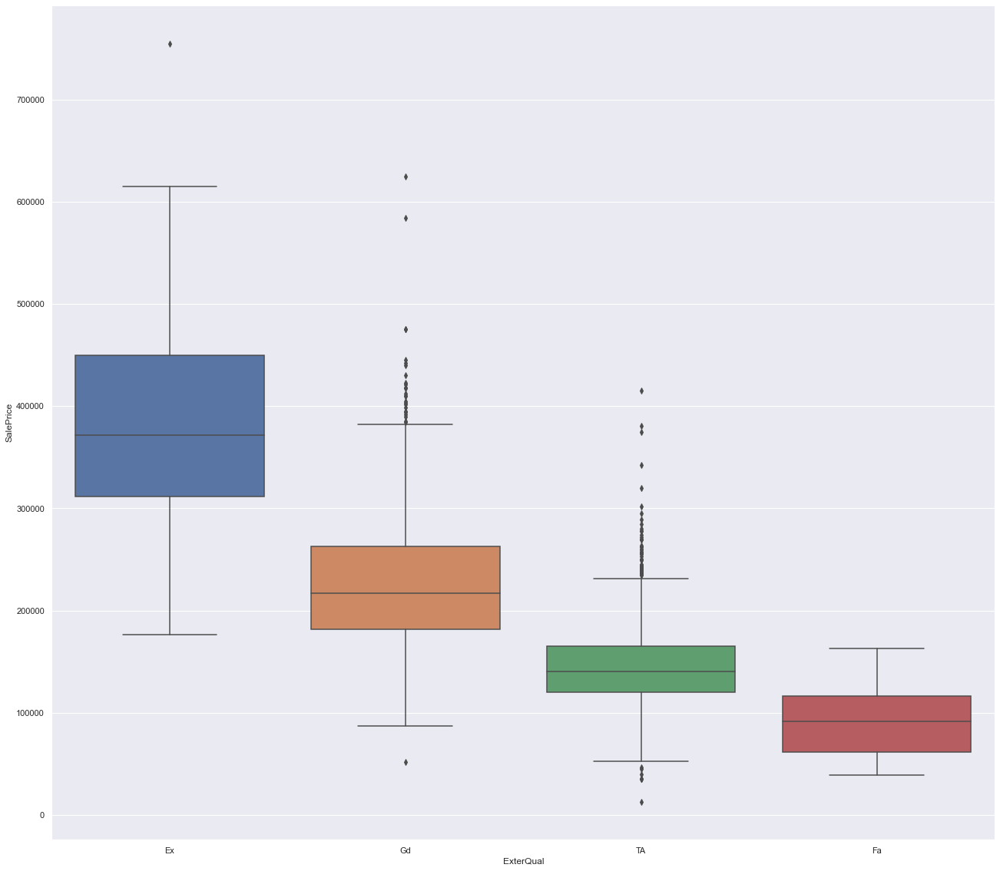

In [123]:
# ExterQual
ordered=housing_fill_drop.groupby(by=["ExterQual"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='ExterQual', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='Exterior1st', ylabel='SalePrice'>

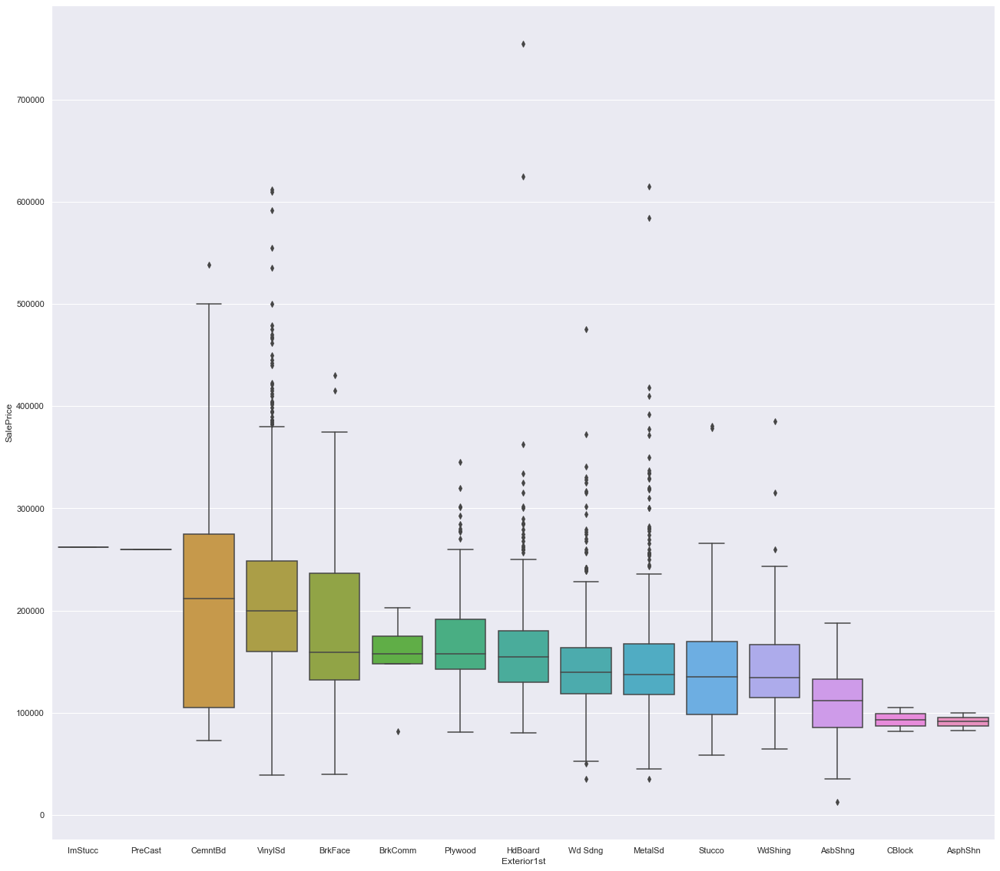

In [124]:
#Exterior1st
ordered=housing_fill_drop.groupby(by=["Exterior1st"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Exterior1st', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='Exterior2nd', ylabel='SalePrice'>

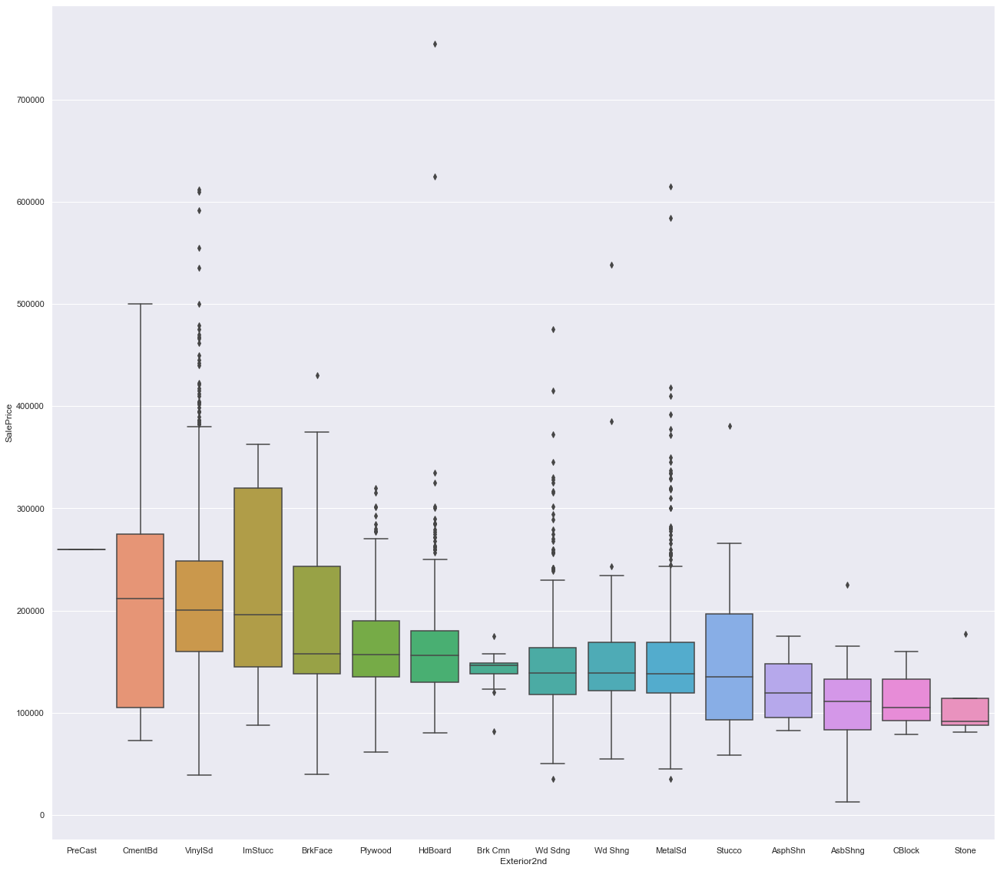

In [125]:
#Exterior2nd
ordered=housing_fill_drop.groupby(by=["Exterior2nd"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Exterior2nd', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='Fence', ylabel='SalePrice'>

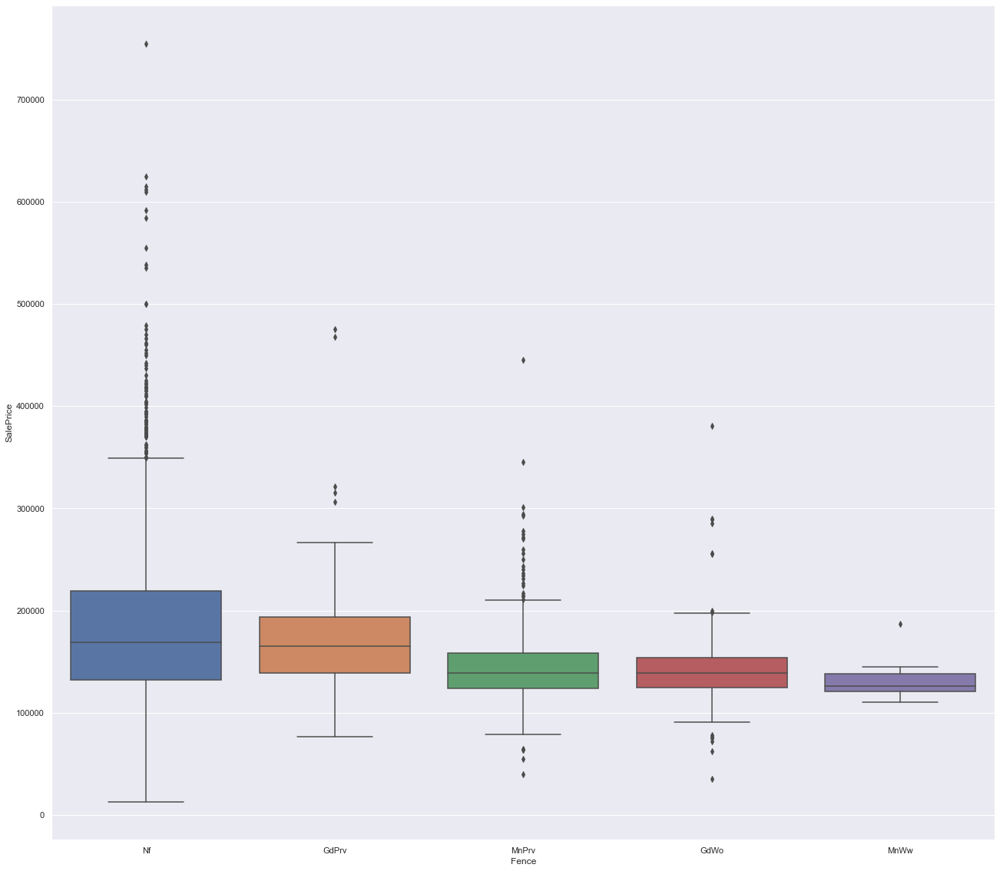

In [126]:
# Fence
ordered=housing_fill_drop.groupby(by=["Fence"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='Fence', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='GarageCars', ylabel='SalePrice'>

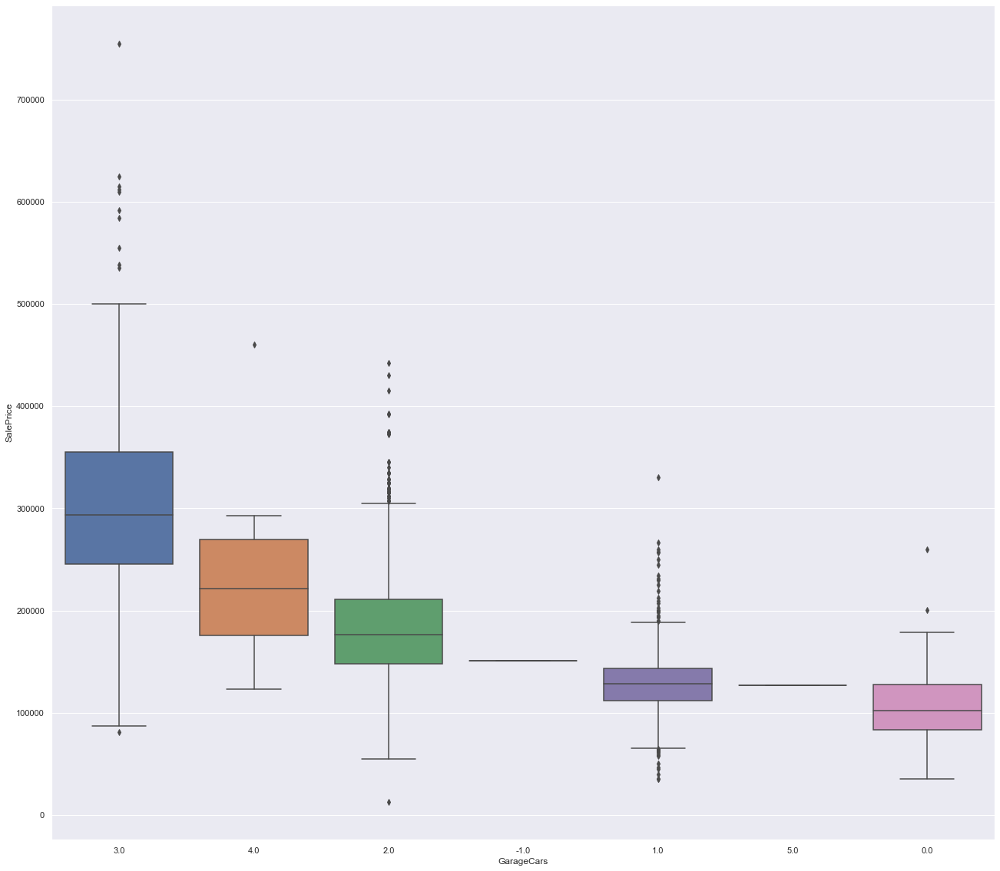

In [127]:
#GARAGE
ordered=housing_fill_drop.groupby(by=["GarageCars"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='GarageCars', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='GarageArea', ylabel='GarageCars'>

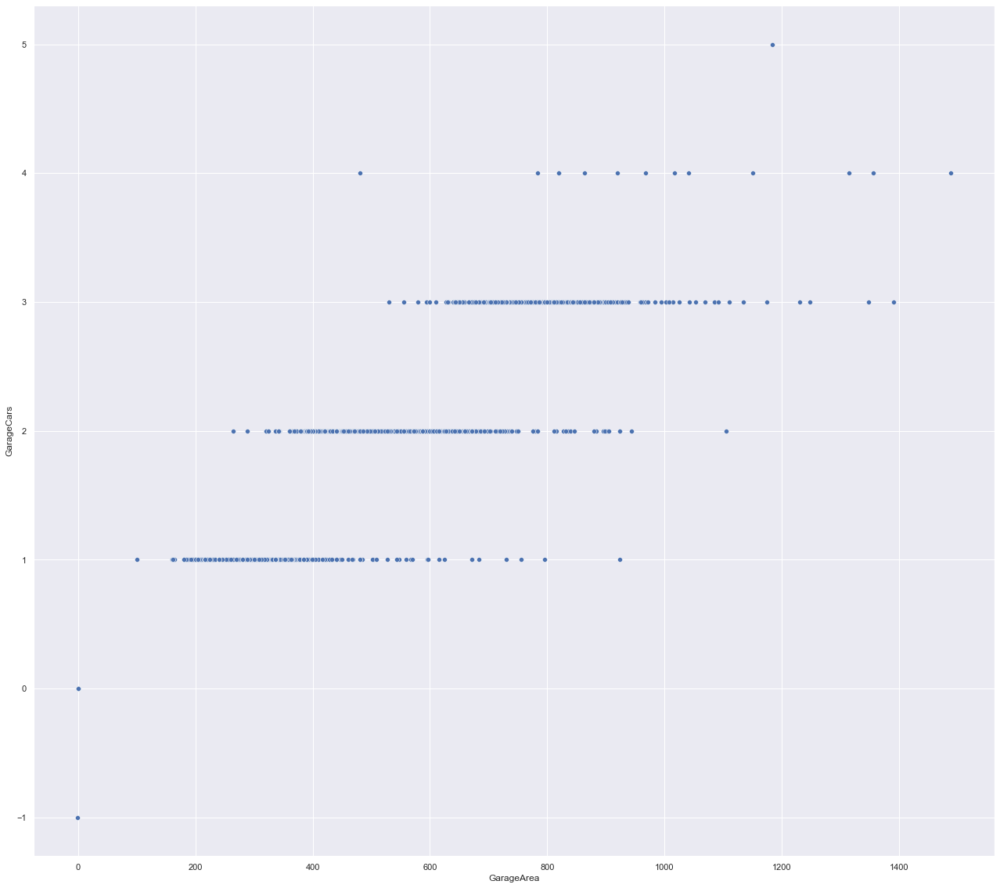

In [128]:
sns.scatterplot(x= 'GarageArea', y='GarageCars', data=housing_fill_drop)

<AxesSubplot:xlabel='GarageCond', ylabel='SalePrice'>

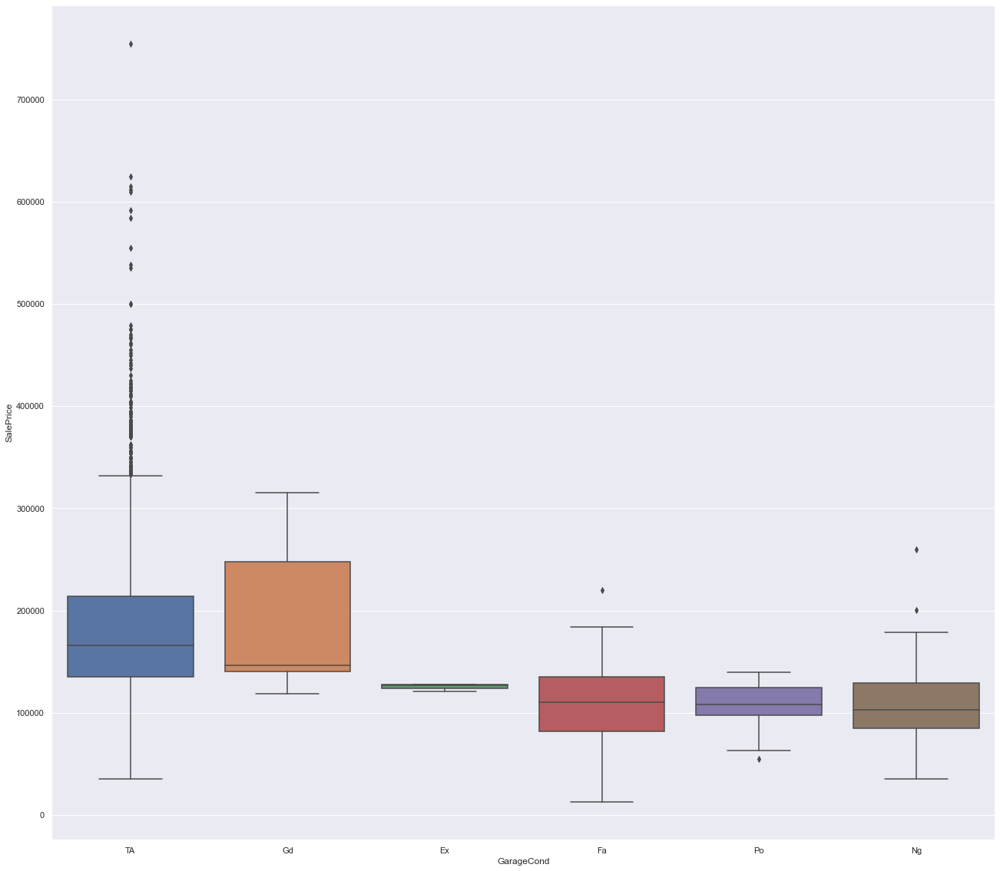

In [129]:
#Leaveout. Not making sense
ordered=housing_fill_drop.groupby(by=["GarageCond"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='GarageCond', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='GarageFinish', ylabel='SalePrice'>

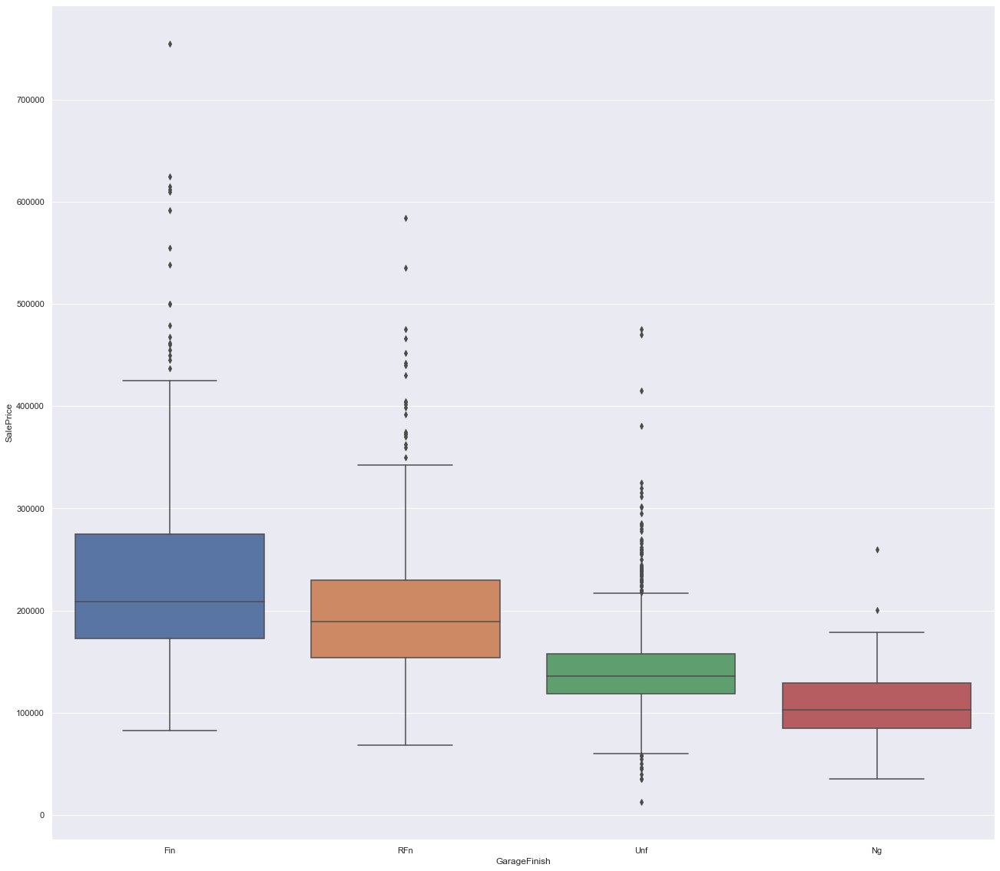

In [130]:
ordered=housing_fill_drop.groupby(by=["GarageFinish"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='GarageFinish', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='GarageQual', ylabel='SalePrice'>

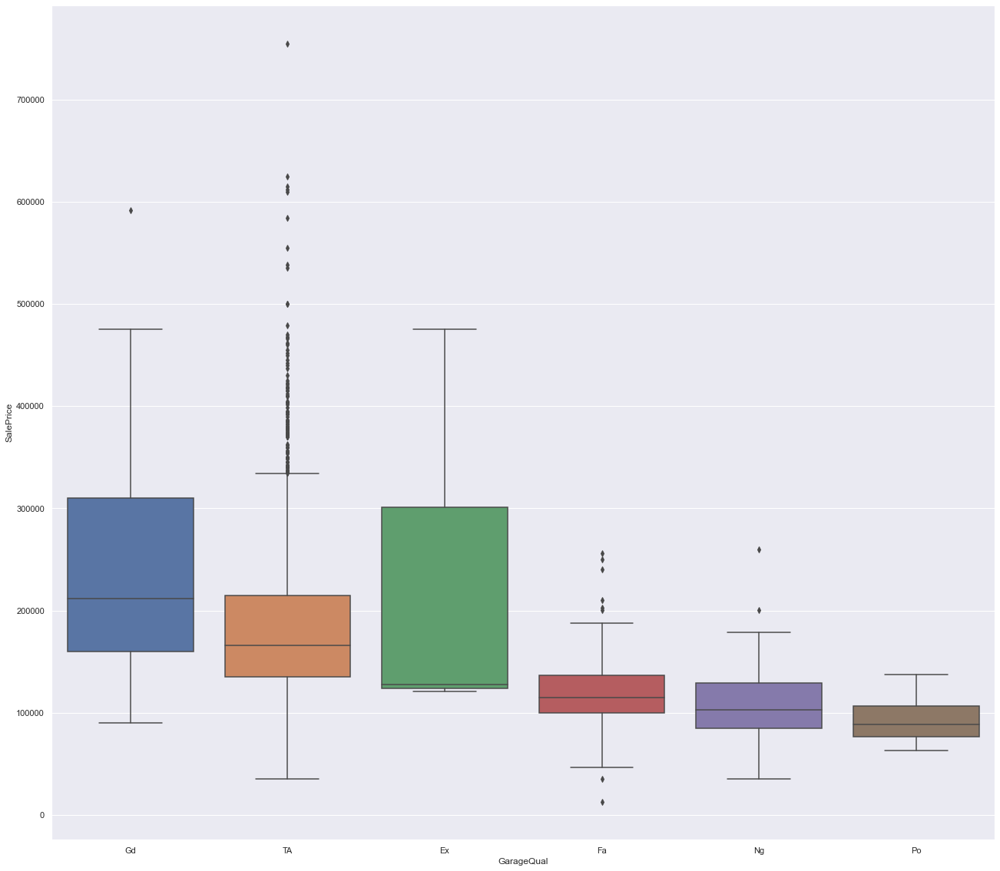

In [131]:
ordered=housing_fill_drop.groupby(by=["GarageQual"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='GarageQual', y='SalePrice', data= housing_fill_drop, order=ordered) 

<AxesSubplot:xlabel='GarageType', ylabel='SalePrice'>

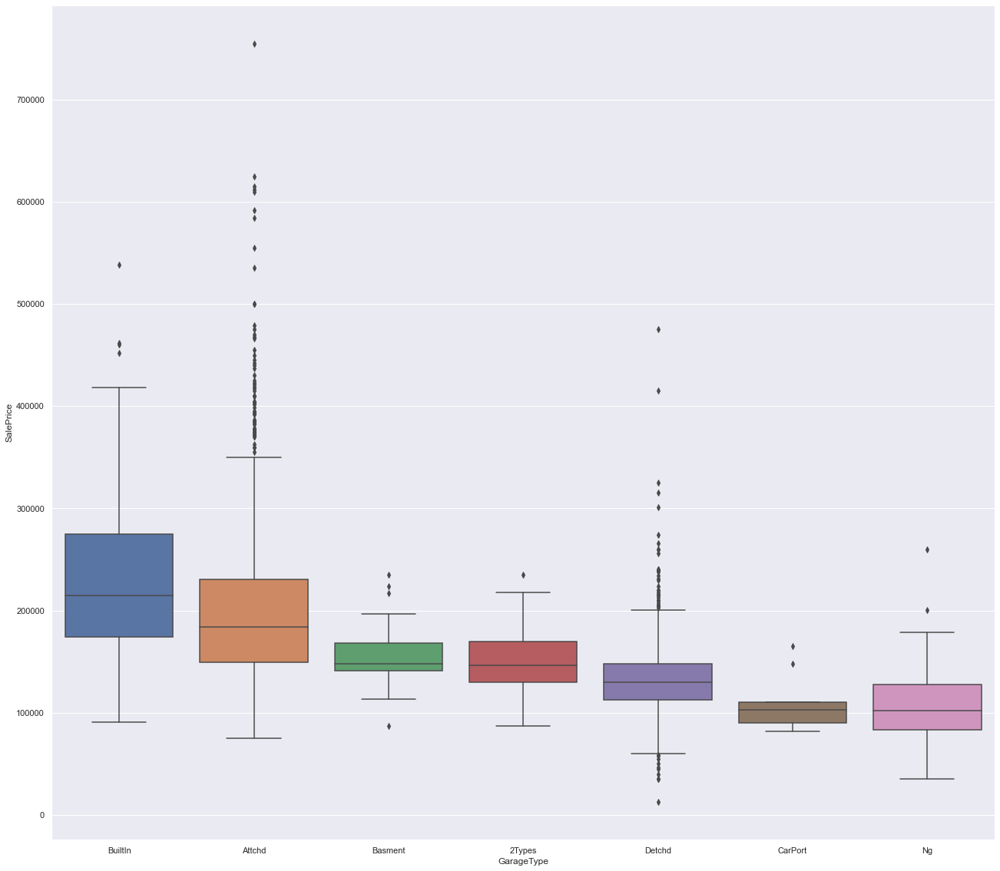

In [132]:
ordered=housing_fill_drop.groupby(by=["GarageType"])["SalePrice"].median().sort_values(ascending=False).index
sns.boxplot(x='GarageType', y='SalePrice', data= housing_fill_drop, order=ordered) 

In [133]:
housing_fill_drop['GarageType'].value_counts()

Attchd     1527
Detchd      716
BuiltIn     153
Ng          127
Basment      27
2Types       21
CarPort       9
Name: GarageType, dtype: int64

<AxesSubplot:xlabel='GarageYrBlt', ylabel='SalePrice'>

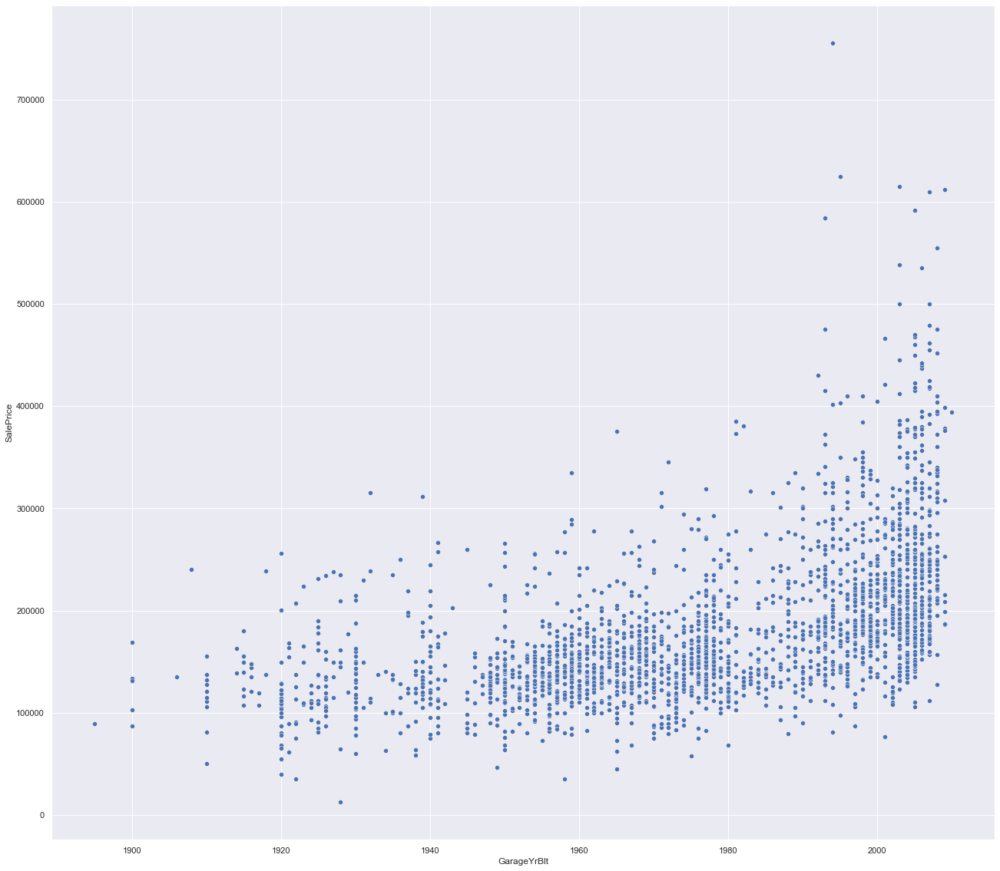

In [134]:
sns.scatterplot(x='GarageYrBlt', y='SalePrice', data= housing_fill_drop)